## 1. 路径配置与标签加载

In [1]:
## 1. 路径配置与标签加载
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
from matplotlib.patches import Rectangle, Patch
import h5py
import pandas as pd
from collections import Counter
from scipy.stats import entropy

# ============================================================================
# 路径配置 - 修改此处切换被试
# ============================================================================

SUBJECT_ID = "ODP_01_qhlazec"
SPLIT_TYPE = "test"

BASE_RESULT_DIR = Path("/home/jovyan/gpu_space/workspace_jiayi/KAN-git/KAN-Brain-Single-Voxel-Segmentaion/3D_dev/training/downsampling/runs/loso_37fold")

if SPLIT_TYPE == "test":
    fold_candidates = list(BASE_RESULT_DIR.glob(f"*_test_{SUBJECT_ID}"))
    FOLD_DIR = fold_candidates[0] if len(fold_candidates) > 0 else BASE_RESULT_DIR / f"fold_01_test_{SUBJECT_ID}"
else:
    FOLD_DIR = BASE_RESULT_DIR / "fold_01_test_ODP_01_qhlazec"

DATA_ROOT = Path("/home/jovyan/gpu_space/workspace_jiayi/alex_datasets/downsampling/3d")
DOWNSAMPLED_FILE = DATA_ROOT / f"{SUBJECT_ID}_downsampled.npz"
PRED_SOFTMAX_FILE = FOLD_DIR / "pred_3d" / f"{SPLIT_TYPE}_{SUBJECT_ID}_pred_softmax_3d.npz"
GT_3D_FILE = DATA_ROOT / "3d" / f"{SUBJECT_ID}_3d.npz"
LABEL_EXCEL = Path("/home/jovyan/gpu_space/workspace_jiayi/KAN-git/KAN-Brain-Single-Voxel-Segmentaion/3D_dev/training/downsampling/Freesurfer_LUT_alex_labels_jiayi.xlsx")

OUTPUT_DIR = FOLD_DIR / "figs" / "confidence_overlay"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

CHANNEL_MPRAGE = 341
CHANNEL_QSM = 350

# ============================================================================
# 可视化参数
# ============================================================================

TAU = 0.4
N_CLASSES = 102
SLICE_AXIS = 'axial'
AUTO_SELECT_SLICES = True
MANUAL_SLICES = [30, 50, 70]
CONTOUR_LEVELS = [0.3]
CONTOUR_LINEWIDTH = 1.5

ZOOM_REGIONS = {
    "cortex_white": {"z": None, "x": None, "y": None, "hw": 20},
    "basal_ganglia": {"z": None, "x": None, "y": None, "hw": 20},
    "brainstem": {"z": None, "x": None, "y": None, "hw": 20}
}

print("✓ 路径配置完成")
print(f"  被试: {SUBJECT_ID}, 类型: {SPLIT_TYPE}")
print(f"  Fold: {FOLD_DIR.name}")
print(f"  输出: {OUTPUT_DIR}")

# ============================================================================
# 加载FreeSurfer标签映射
# ============================================================================

print("\n加载FreeSurfer标签映射...")
label_df = pd.read_excel(LABEL_EXCEL)
valid_labels = label_df[label_df['one_hot_loc_alex_label'] != '[]'].copy()
valid_labels['label_idx'] = valid_labels['one_hot_loc_alex_label'].astype(int)

LABEL_NAMES = {0: 'Background'}
LABEL_COLORS_RGB = {0: (0, 0, 0)}

for idx, row in valid_labels.iterrows():
    label_idx = int(row['label_idx'])
    if 1 <= label_idx <= N_CLASSES and label_idx not in LABEL_NAMES:
        LABEL_NAMES[label_idx] = row['tissue_name'].strip("'")
        LABEL_COLORS_RGB[label_idx] = (row['R']/255, row['G']/255, row['B']/255)

colors_list = [LABEL_COLORS_RGB.get(i, (0, 0, 0)) for i in range(N_CLASSES)]
cmap_freesurfer = mcolors.ListedColormap(colors_list)

print(f"✓ 加载了 {len(LABEL_NAMES)} 个标签")

✓ 路径配置完成
  被试: ODP_01_qhlazec, 类型: test
  Fold: fold_01_test_ODP_01_qhlazec
  输出: /home/jovyan/gpu_space/workspace_jiayi/KAN-git/KAN-Brain-Single-Voxel-Segmentaion/3D_dev/training/downsampling/runs/loso_37fold/fold_01_test_ODP_01_qhlazec/figs/confidence_overlay

加载FreeSurfer标签映射...
✓ 加载了 103 个标签


In [2]:
## 2. 加载数据并计算置信度与不确定性
# print("加载数据...")

# 预测概率
pred_data = np.load(PRED_SOFTMAX_FILE)
pred_softmax = pred_data['pred_softmax_3d']
print(f"  预测概率: {pred_softmax.shape}")

# Ground Truth
gt_data = np.load(GT_3D_FILE)
gt_proba = gt_data['proba_labels']
region_mask = gt_data['region_mask_lr']
print(f"  Ground Truth: {gt_proba.shape}")

# MPRAGE底图
if DOWNSAMPLED_FILE.exists():
    downsampled_data = np.load(DOWNSAMPLED_FILE)
    data_lr = downsampled_data['data_lr']
    anatomy_img = data_lr[..., CHANNEL_MPRAGE]
    anatomy_name = "MPRAGE"
    print(f"  MPRAGE底图: {anatomy_img.shape}")
else:
    anatomy_img = np.zeros(pred_softmax.shape[:3])
    anatomy_name = "No Anatomy"

# ============================================================================
# 计算置信度
# ============================================================================

print("\n计算置信度与不确定性...")

top2_indices = np.argsort(pred_softmax, axis=-1)[..., -2:]
top1_class = top2_indices[..., 1]
top2_class = top2_indices[..., 0]

top2_probs = np.take_along_axis(pred_softmax, top2_indices, axis=-1)
p1 = top2_probs[..., 1]
p2 = top2_probs[..., 0]

# 边际差 (margin)
margin = p1 - p2  # (Z, X, Y)
alpha_map = np.clip(margin / TAU, 0, 1)
alpha_map[region_mask == 0] = 0

# ============================================================================
# 计算熵图（不确定性）
# ============================================================================

# H(p) = -Σ_k p_k log(p_k)
# 使用scipy.stats.entropy，axis=-1计算每个体素的熵
epsilon = 1e-10  # 避免log(0)
pred_softmax_safe = np.clip(pred_softmax, epsilon, 1.0)

# entropy使用自然对数，转换为bits需要除以log(2)
entropy_map = entropy(pred_softmax_safe.T, axis=0).T  # scipy要求axis=0，所以转置
entropy_map = entropy_map / np.log(2)  # 转为bits

# 应用ROI掩码
entropy_map_masked = entropy_map.copy()
entropy_map_masked[region_mask == 0] = 0

# 统计
entropy_roi = entropy_map[region_mask > 0]
margin_roi = margin[region_mask > 0]

print(f"  边际差 (Margin, ROI内):")
print(f"    Mean={margin_roi.mean():.4f}, Median={np.median(margin_roi):.4f}")
print(f"    Range=[{margin_roi.min():.4f}, {margin_roi.max():.4f}]")

print(f"  熵 (Entropy, ROI内):")
print(f"    Mean={entropy_roi.mean():.4f} bits, Median={np.median(entropy_roi):.4f} bits")
print(f"    Range=[{entropy_roi.min():.4f}, {entropy_roi.max():.4f}] bits")
print(f"    Max possible: {np.log2(N_CLASSES):.2f} bits (uniform distribution)")

# ============================================================================
# 自动选择切片
# ============================================================================

if AUTO_SELECT_SLICES:
    print("\n自动选择切片...")
    axis_size = pred_softmax.shape[0]
    slice_scores = []
    
    for z in range(axis_size):
        mask_slice = region_mask[z] > 0
        if mask_slice.sum() > 100:
            # 使用熵的标准差作为信息量度量
            entropy_std = entropy_map[z][mask_slice].std()
            mask_ratio = mask_slice.sum() / mask_slice.size
            slice_scores.append((z, entropy_std * mask_ratio))
    
    slice_scores.sort(key=lambda x: x[1], reverse=True)
    selected_slices = []
    for z, score in slice_scores:
        if len(selected_slices) == 0 or all(abs(z - s) >= 10 for s in selected_slices):
            selected_slices.append(z)
        if len(selected_slices) >= 3:
            break
    
    MANUAL_SLICES = sorted(selected_slices)
    print(f"  选择的切片: {MANUAL_SLICES}")

print("\n✓ 数据准备完成")

  预测概率: (18, 121, 92, 102)
  Ground Truth: (18, 121, 92, 102)

计算置信度与不确定性...
  边际差 (Margin, ROI内):
    Mean=0.3315, Median=0.2632
    Range=[0.0000, 0.9994]
  熵 (Entropy, ROI内):
    Mean=1.9905 bits, Median=2.0263 bits
    Range=[0.0060, 4.9080] bits
    Max possible: 6.67 bits (uniform distribution)

自动选择切片...
  选择的切片: [7, 17]

✓ 数据准备完成


NameError: name 'ref_mode' is not defined

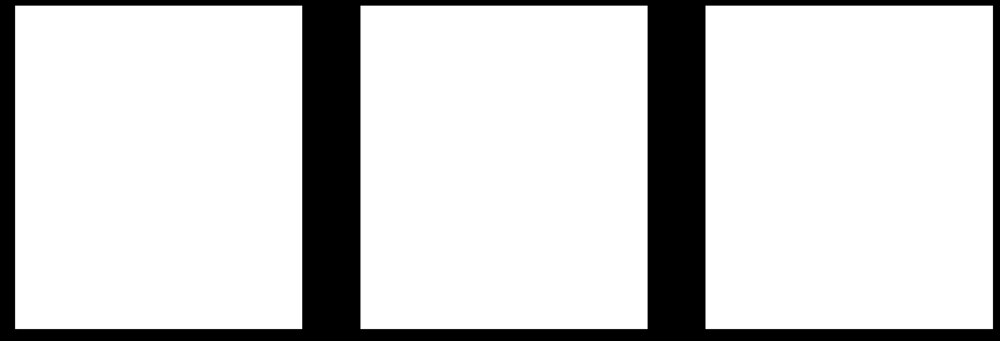

In [3]:
# ====================== 绘制三联图（换行与不重叠版） ======================
import textwrap

# 建议：关闭 constrained_layout，手动控制边距，给右侧图例留白
fig, axes = plt.subplots(1, 3, figsize=(36, 12))
fig.patch.set_facecolor('black')

# —— 工具：包一层自动换行 —— 
def wrap(s, width=28):
    # 你可以按需要调宽度（越小越容易换行）
    return textwrap.fill(s, width=width)

def set_title(ax, s, fontsize=18, pad=8):
    txt = ax.set_title(wrap(s), fontsize=fontsize, fontweight='bold',
                       color='white', pad=pad, wrap=True)
    # 增加行距，避免多行贴在一起
    txt.set_linespacing(1.15)

def plot_categorical_map(ax, label_map, mask, title, show_red_mask=False, red_mask_data=None):
    label_rgb = np.zeros((*label_map.shape, 3))
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if class_mask.any():
            color = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))
            label_rgb[class_mask] = color

    ax.imshow(label_rgb, aspect='auto', interpolation='nearest', origin='lower')

    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((*label_map.shape, 4))
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, aspect='auto', interpolation='nearest', origin='lower')

    ax.contour(np.flipud(mask), levels=[0.5], colors='cyan',
               linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')
    set_title(ax, title, fontsize=18, pad=10)

# (a) Reference Mode
plot_categorical_map(
    axes[0],
    ref_mode,
    mask_slice,
    f'(a) Reference Mode\n(argmax of soft reference)\nSlice {SLICE_IDX}'
)

# (b) Top-1 Prediction
plot_categorical_map(
    axes[1],
    pred_top1,
    mask_slice,
    f'(b) Top-1 Prediction\n(argmax of p_pred, post-T)\nSlice {SLICE_IDX}'
)

# (c) Top-3 Union + 红遮罩
plot_categorical_map(
    axes[2],
    ref_mode,  # 用参考颜色做底色
    mask_slice,
    f'(c) Top-{K_TOP} Union + Uncovered Mask\n'
    f'Red = Ref mode NOT in pred Top-{K_TOP}\n'
    f'Coverage: {100-red_ratio:.1f}%, Uncovered: {red_ratio:.1f}%',
    show_red_mask=True,
    red_mask_data=red_mask
)

# —— 图例：放右侧，避免挤占子图 —— 
legend_labels = []
for class_idx in [0, 2, 7, 10, 41, 42]:
    if class_idx in LABEL_NAMES:
        legend_labels.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx],
                  edgecolor='white', label=LABEL_NAMES[class_idx])
        )
legend_labels.append(
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
)

fig.legend(handles=legend_labels, loc='center left', bbox_to_anchor=(0.985, 0.5),
           frameon=True, facecolor='black', edgecolor='white',
           fontsize=12, labelcolor='white')

# —— 主标题：先手动换行，再留出顶端空间 —— 
suptitle_str = (
    f'Figure 1: Reference Mode | Top-1 Prediction | Top-{K_TOP} Union with Uncovered Regions\n'
    f'Subject: {SUBJECT_ID}, Slice: {SLICE_IDX}, {SPLIT_TYPE.upper()} set'
)
fig.suptitle(textwrap.fill(suptitle_str, width=70),
             fontsize=16, fontweight='bold', color='white', y=0.98)

# —— 关键：留白，防止重叠（右侧图例+上方主标题） —— 
# right 要小于 1 给 legend，top 要小于 1 给 suptitle，wspace 调小减少子图间空隙
fig.subplots_adjust(left=0.03, right=0.93, top=0.90, bottom=0.03, wspace=0.03)

plt.show()


=== Figure 1 三联图生成 ===
被试: ODP_01_qhlazec, 切片: 17
规则: 硬规则（参考众数是否落入Top-3）

=== 统计信息 ===
ROI 总像素数: 4271
红遮罩像素数: 930
红遮罩比例: 21.77%
Top-3 覆盖率: 78.23%

软覆盖分数（额外信息）:
  Mean=0.7436, Median=0.9613
  Range=[0.0000, 1.0030]


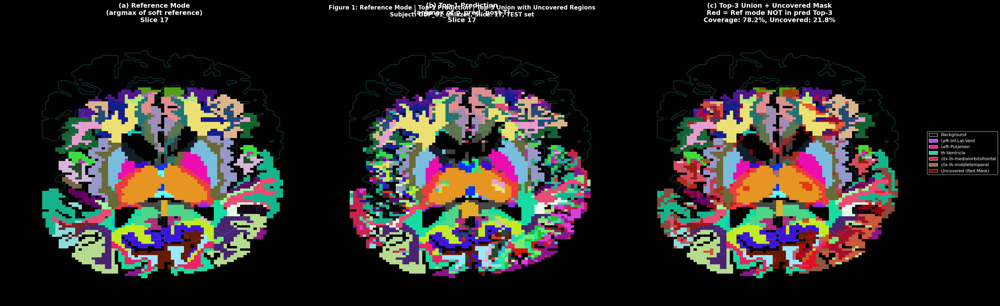


=== 软覆盖分数直方图 (10 bins) ===
  [0.00, 0.10): 708 pixels (16.58%)
  [0.10, 0.20): 58 pixels (1.36%)
  [0.20, 0.30): 36 pixels (0.84%)
  [0.30, 0.40): 55 pixels (1.29%)
  [0.40, 0.50): 76 pixels (1.78%)
  [0.50, 0.60): 95 pixels (2.22%)
  [0.60, 0.70): 156 pixels (3.65%)
  [0.70, 0.80): 227 pixels (5.31%)
  [0.80, 0.90): 321 pixels (7.52%)
  [0.90, 1.00): 1728 pixels (40.46%)

✓ Figure 1 生成完成！


In [12]:
## Figure 1: 三联图 - Reference Mode | Top-1 | Top-3 Union + 未覆盖红遮罩
# ============================================================================
# ISMRM 图像制图工程师 - Figure 1 生成
# ============================================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

# ============================================================================
# 参数配置
# ============================================================================

SLICE_IDX = 17  # 可手动切换切片
TAU_HARD = True  # 使用硬规则（参考众数是否落入Top-3）
RED_MASK_COLOR = (220/255, 0, 0, 0.6)  # RGBA for red mask
K_TOP = 3  # Top-K

print(f"=== Figure 1 三联图生成 ===")
print(f"被试: {SUBJECT_ID}, 切片: {SLICE_IDX}")
print(f"规则: 硬规则（参考众数是否落入Top-{K_TOP}）")

# ============================================================================
# 提取切片数据
# ============================================================================

# 预测后验 (post-T)
p_pred_slice = pred_softmax[SLICE_IDX, :, :, :]  # (H, W, C=102)

# 软参考标签
p_ref_slice = gt_proba[SLICE_IDX, :, :, :]  # (H, W, C=102)

# ROI掩膜
mask_slice = region_mask[SLICE_IDX, :, :]  # (H, W)

# 解剖底图（可选）
anatomy_slice = anatomy_img[SLICE_IDX, :, :]

# ============================================================================
# 计算三个面板的内容
# ============================================================================

# (a) 参考众数（Reference mode）: argmax of soft reference
ref_mode = np.argmax(p_ref_slice, axis=-1)  # (H, W)

# (b) Top-1 预测
pred_top1 = np.argmax(p_pred_slice, axis=-1)  # (H, W)

# (c) Top-3 union + 红遮罩
# 获取 Top-3 classes (每个像素)
top3_indices = np.argsort(p_pred_slice, axis=-1)[..., -K_TOP:]  # (H, W, 3)

# 硬规则：检查 ref_mode 是否在 pred_top3 中
covered_mask = np.zeros(ref_mode.shape, dtype=bool)  # (H, W)
for i in range(ref_mode.shape[0]):
    for j in range(ref_mode.shape[1]):
        if mask_slice[i, j] > 0:  # 只在ROI内计算
            ref_class = ref_mode[i, j]
            pred_top3_classes = top3_indices[i, j, :]
            covered_mask[i, j] = ref_class in pred_top3_classes

# 红遮罩：ref_mode 不在 Top-3 中
red_mask = (~covered_mask) & (mask_slice > 0)  # (H, W)

# ============================================================================
# 统计信息（校验输出）
# ============================================================================

roi_pixels = mask_slice > 0
total_roi = roi_pixels.sum()
red_pixels = red_mask.sum()
red_ratio = 100 * red_pixels / total_roi if total_roi > 0 else 0

print(f"\n=== 统计信息 ===")
print(f"ROI 总像素数: {total_roi}")
print(f"红遮罩像素数: {red_pixels}")
print(f"红遮罩比例: {red_ratio:.2f}%")
print(f"Top-{K_TOP} 覆盖率: {100 - red_ratio:.2f}%")

# 软覆盖分数分布（额外信息，用于对比）
soft_coverage = np.zeros(ref_mode.shape)
for i in range(ref_mode.shape[0]):
    for j in range(ref_mode.shape[1]):
        if mask_slice[i, j] > 0:
            pred_top3_classes = top3_indices[i, j, :]
            soft_coverage[i, j] = p_ref_slice[i, j, pred_top3_classes].sum()

soft_cov_roi = soft_coverage[roi_pixels]
print(f"\n软覆盖分数（额外信息）:")
print(f"  Mean={soft_cov_roi.mean():.4f}, Median={np.median(soft_cov_roi):.4f}")
print(f"  Range=[{soft_cov_roi.min():.4f}, {soft_cov_roi.max():.4f}]")

# ============================================================================
# 绘制三联图
# ============================================================================

fig, axes = plt.subplots(1, 3, figsize=(36, 12))

# 通用设置函数
def plot_categorical_map(ax, label_map, mask, title, show_red_mask=False, red_mask_data=None):
    """
    绘制分类图（统一LUT，无透明度）
    
    Parameters:
    - ax: matplotlib axis
    - label_map: (H, W) 整数标签
    - mask: (H, W) ROI掩膜
    - title: 标题
    - show_red_mask: 是否叠加红遮罩
    - red_mask_data: (H, W) 红遮罩布尔数组
    """
    # 背景黑色
    label_rgb = np.zeros((*label_map.shape, 3))
    
    # 应用FreeSurfer LUT
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if class_mask.any():
            color = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))
            label_rgb[class_mask] = color
    
    # 显示分类图（无透明度）
    ax.imshow(label_rgb, aspect='auto', interpolation='nearest', origin='lower')
    
    # 叠加红遮罩（如果需要）
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((*label_map.shape, 4))
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, aspect='auto', interpolation='nearest', origin='lower')
    
    # ROI边界（青色虚线）
    ax.contour(np.flipud(mask), levels=[0.5], colors='cyan', 
               linewidths=1.0, linestyles='--', alpha=0.5)
    
    ax.set_title(title, fontsize=18, fontweight='bold', color='white', pad=10)
    ax.axis('off')

# ========================================================================
# (a) Reference Mode
# ========================================================================
plot_categorical_map(
    axes[0], 
    ref_mode, 
    mask_slice,
    f'(a) Reference Mode\n(argmax of soft reference)\nSlice {SLICE_IDX}'
)

# ========================================================================
# (b) Top-1 Prediction
# ========================================================================
plot_categorical_map(
    axes[1], 
    pred_top1, 
    mask_slice,
    f'(b) Top-1 Prediction\n(argmax of p_pred, post-T)\nSlice {SLICE_IDX}'
)

# ========================================================================
# (c) Top-3 Union + 红遮罩
# ========================================================================
plot_categorical_map(
    axes[2], 
    ref_mode,  # 显示参考颜色作为底色
    mask_slice,
    f'(c) Top-{K_TOP} Union + Uncovered Mask\n' +
    f'Red = Ref mode NOT in pred Top-{K_TOP}\n' +
    f'Coverage: {100-red_ratio:.1f}%, Uncovered: {red_ratio:.1f}%',
    show_red_mask=True,
    red_mask_data=red_mask
)

# ========================================================================
# 图例（可选，显示几个主要脑区颜色）
# ========================================================================

# 选择几个代表性标签
legend_labels = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：背景+几个主要脑区
    if class_idx in LABEL_NAMES:
        legend_labels.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], 
                  edgecolor='white', label=LABEL_NAMES[class_idx])
        )

# 红遮罩图例
legend_labels.append(
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
)

# 添加图例到右侧
fig.legend(handles=legend_labels, loc='center left', bbox_to_anchor=(1.0, 0.5),
           frameon=True, facecolor='black', edgecolor='white', 
           fontsize=12, labelcolor='white')

# ========================================================================
# 统一设置
# ========================================================================

plt.tight_layout()
fig.patch.set_facecolor('black')

# 添加总标题
fig.suptitle(f'Figure 1: Reference Mode | Top-1 Prediction | Top-{K_TOP} Union with Uncovered Regions\n' +
             f'Subject: {SUBJECT_ID}, Slice: {SLICE_IDX}, {SPLIT_TYPE.upper()} set',
             fontsize=16, fontweight='bold', color='white', y=0.98)

plt.show()

# ============================================================================
# 保存统计数据（CSV）- 可选
# ============================================================================

# 软覆盖直方图（10 bins）
hist, bin_edges = np.histogram(soft_cov_roi, bins=10, range=(0, 1))
hist_data = {
    'bin_left': bin_edges[:-1],
    'bin_right': bin_edges[1:],
    'count': hist,
    'percentage': 100 * hist / total_roi
}

print(f"\n=== 软覆盖分数直方图 (10 bins) ===")
for i in range(10):
    print(f"  [{hist_data['bin_left'][i]:.2f}, {hist_data['bin_right'][i]:.2f}): " +
          f"{hist_data['count'][i]} pixels ({hist_data['percentage'][i]:.2f}%)")

print(f"\n✓ Figure 1 生成完成！")

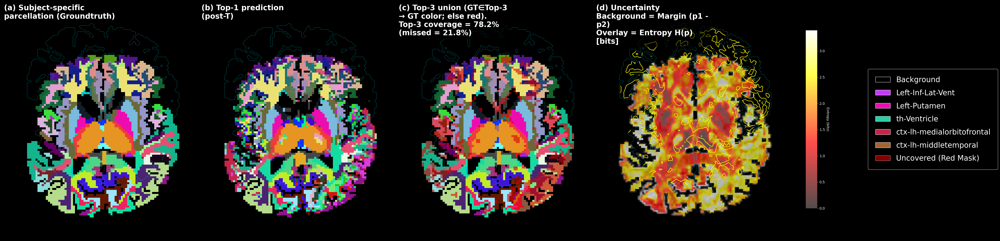

In [13]:
# ====================== 四联图：无总标题，面板内标题 + 右侧全局色条 ======================
import numpy as np
import matplotlib.pyplot as plt
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数 ----------
# def panel_title(ax, s):
#     s = textwrap.fill(s, width=24)
#     ax.text(
#         0.01, 0.99, s,
#         transform=ax.transAxes, va='top', ha='left',
#         fontsize=16, fontweight='bold', color='white',
#         bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none')
#     )

def plot_categorical_map(ax, label_map, mask, title, show_red_mask=False, red_mask_data=None):
    label_rgb = np.zeros((*label_map.shape, 3))
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if class_mask.any():
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))
    ax.imshow(label_rgb, aspect='auto', interpolation='nearest', origin='lower')

    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((*label_map.shape, 4))
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, aspect='auto', interpolation='nearest', origin='lower')

    ax.contour(np.flipud(mask), levels=[0.5], colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')
    # panel_title(ax, title)

# ---------- 画布 ----------
fig, axes = plt.subplots(1, 4, figsize=(46, 12), constrained_layout=False)
fig.patch.set_facecolor('black')

# ---------- (a) Groundtruth ----------
plot_categorical_map(
    axes[0], ref_mode, mask_slice,
    '(a) Subject-specific parcellation (Groundtruth)'
)

# ---------- (b) Top-1 ----------
plot_categorical_map(
    axes[1], pred_top1, mask_slice,
    '(b) Top-1 prediction (post-T)'
)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(
    axes[2], ref_mode, mask_slice,
    f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
    f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
    show_red_mask=True, red_mask_data=red_mask
)

# ---------- (d) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (d) 底图与叠加：都加 origin='lower'
axes[3].imshow(margin_norm, cmap='gray', aspect='auto',
               interpolation='bilinear', vmin=0, vmax=1, origin='lower')

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = axes[3].imshow(entropy_masked, cmap='hot', aspect='auto',
                    interpolation='bilinear', alpha=0.70,
                    vmin=0.0, vmax=ent_vmax, origin='lower')

# (d) 等高线：传入翻转后的数组，和 origin='lower' 对齐
axes[3].contour(np.flipud(mask_slice), levels=[0.5],
                colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    ent_for_contour = np.ma.masked_where(~np.flipud(roi), np.flipud(entropy_map))
    axes[3].contour(ent_for_contour, levels=[hi_thr],
                    colors='yellow', linewidths=2.0, alpha=0.85)

def panel_title(ax, s, fontsize=18, width=24, x=0.01, y=0.99):
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )


panel_title(axes[0], '(a) Subject-specific parcellation (Groundtruth)', fontsize=25, width=26)
panel_title(axes[1], '(b) Top-1 prediction (post-T)', fontsize=25, width=26)
panel_title(axes[2],
            f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
            f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
            fontsize=25, width=26)
panel_title(axes[3],
            '(d) Uncertainty\nBackground = Margin (p1 - p2)\n'
            f'Overlay = Entropy H(p) [{entropy_unit_label}]',
            fontsize=25, width=28)


axes[3].axis('off')

# ---------- 右侧图例 ----------
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )
legend_handles.append(
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
)

# ---------- 布局留白 + 右侧全局色条 ----------
# 给右侧留更宽的边
fig.subplots_adjust(left=0.02, right=0.82, top=0.96, bottom=0.03, wspace=0.03)

# 把色条往左移一点，瘦一点（避免挤占标签）
cax = fig.add_axes([0.84, 0.15, 0.012, 0.70])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=14,
               color='white', fontsize=12)
cbar.ax.tick_params(colors='white', labelsize=12)

# 把图例放到更宽的位置，并放大字体
fig.legend(
    handles=legend_handles,
    loc='center left',
    bbox_to_anchor=(0.90, 0.5),   # 比原来的 0.975 提前一些，让它占更多宽度
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=25, labelcolor='white',  # 字体变大，patch 也会随之变大
    borderpad=1.0, labelspacing=0.8, handlelength=2
)


plt.show()


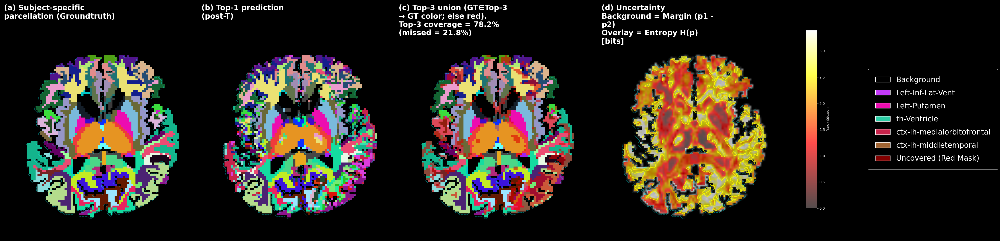

In [14]:
# ====================== 四联图：无总标题，面板内标题 + 右侧全局色条 ======================
import numpy as np
import matplotlib.pyplot as plt
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=25, width=26, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    label_rgb = np.zeros((H, W, 3), dtype=float)
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')


# ---------- 画布 ----------
fig, axes = plt.subplots(1, 4, figsize=(46, 12), constrained_layout=False)
fig.patch.set_facecolor('black')

# ---------- (a) Groundtruth ----------
plot_categorical_map(
    axes[0], ref_mode, mask_slice,
    '(a) Subject-specific parcellation (Groundtruth)'
)

# ---------- (b) Top-1 ----------
plot_categorical_map(
    axes[1], pred_top1, mask_slice,
    '(b) Top-1 prediction (post-T)'
)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(
    axes[2], ref_mode, mask_slice,
    f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
    f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
    show_red_mask=True, red_mask_data=red_mask
)

# ---------- (d) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (d) 底图与叠加：统一坐标（extent + origin='lower'）
H, W = margin_norm.shape
extent = (0, W, 0, H)

axes[3].imshow(margin_norm, cmap='gray', origin='lower',
               interpolation='bilinear', vmin=0, vmax=1, extent=extent)

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = axes[3].imshow(entropy_masked, cmap='hot', origin='lower',
                    interpolation='bilinear', alpha=0.70,
                    vmin=0.0, vmax=ent_vmax, extent=extent)

Y, X = np.mgrid[0:H, 0:W]
axes[3].contour(X, Y, mask_slice.astype(float), levels=[0.5],
                colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    axes[3].contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                    colors='yellow', linewidths=2.0, alpha=0.85)

# ---------- 面板标题（只在这里调一次字号/宽度） ----------
panel_title(axes[0], '(a) Subject-specific parcellation (Groundtruth)', fontsize=25, width=26)
panel_title(axes[1], '(b) Top-1 prediction (post-T)', fontsize=25, width=26)
panel_title(axes[2],
            f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
            f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
            fontsize=25, width=26)
panel_title(axes[3],
            '(d) Uncertainty\nBackground = Margin (p1 - p2)\n'
            f'Overlay = Entropy H(p) [{entropy_unit_label}]',
            fontsize=25, width=28)
axes[3].axis('off')

# ---------- 右侧图例 ----------
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )
legend_handles.append(
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
)

# ---------- 布局留白 + 右侧全局色条 ----------
# 给右侧留更宽的边
fig.subplots_adjust(left=0.02, right=0.82, top=0.96, bottom=0.03, wspace=0.03)

# 把色条往左移一点，瘦一点（避免挤占标签）
cax = fig.add_axes([0.84, 0.15, 0.012, 0.70])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=14,
               color='white', fontsize=12)
cbar.ax.tick_params(colors='white', labelsize=12)

# 把图例放到更宽的位置，并放大字体
fig.legend(
    handles=legend_handles,
    loc='center left',
    bbox_to_anchor=(0.90, 0.5),   # 比原来的 0.975 提前一些，让它占更多宽度
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=25, labelcolor='white',  # 字体变大，patch 也会随之变大
    borderpad=1.0, labelspacing=0.8, handlelength=2
)

plt.show()


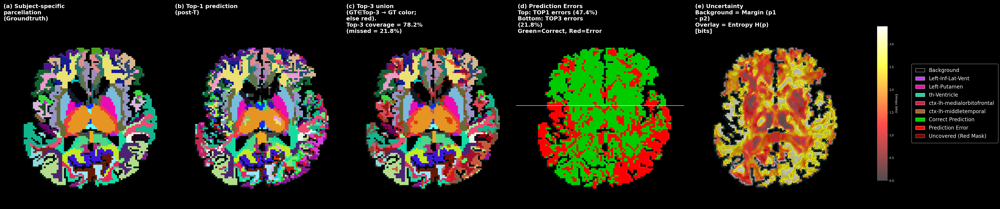

In [15]:
# ====================== 五联图：无总标题，面板内标题 + 右侧全局色条 + 错误可视化 ======================
import numpy as np
import matplotlib.pyplot as plt
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=22, width=24, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    label_rgb = np.zeros((H, W, 3), dtype=float)
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    - gt_map: ground truth标签
    - pred_map: 预测标签 (TOP1) 或者 None (如果是TOP3)
    - mask: ROI mask
    - top3_union_correct: 对于TOP3情况，传入TOP3并集是否正确的布尔数组
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：黑色背景
    error_rgb = np.zeros((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        # 错误区域显示为红色
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        # 错误区域显示为红色  
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ---------- 画布：改为5个子图 ----------
fig, axes = plt.subplots(1, 5, figsize=(58, 12), constrained_layout=False)
fig.patch.set_facecolor('black')

# ---------- (a) Groundtruth ----------
plot_categorical_map(
    axes[0], ref_mode, mask_slice,
    '(a) Subject-specific parcellation (Groundtruth)'
)

# ---------- (b) Top-1 ----------
plot_categorical_map(
    axes[1], pred_top1, mask_slice,
    '(b) Top-1 prediction (post-T)'
)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(
    axes[2], ref_mode, mask_slice,
    f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
    f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
    show_red_mask=True, red_mask_data=red_mask
)

# ---------- (d) 新增：错误可视化 ----------
# 计算TOP1错误
top1_error_rgb, top1_error_rate = plot_error_map(axes[3], ref_mode, pred_top1, mask_slice)

# 计算TOP3错误（基于red_mask，red_mask表示GT不在TOP3中的位置）
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(axes[3], ref_mode, None, mask_slice, top3_correct)

# 创建组合错误图：上半部分显示TOP1错误，下半部分显示TOP3错误
H, W = ref_mode.shape
extent = (0, W, 0, H)
combined_error = np.zeros((H, W, 3), dtype=float)

# 上半部分：TOP1错误
mid_h = H // 2
combined_error[:mid_h, :] = top1_error_rgb[:mid_h, :]
# 下半部分：TOP3错误  
combined_error[mid_h:, :] = top3_error_rgb[mid_h:, :]

axes[3].imshow(combined_error, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

# 添加分割线
axes[3].axhline(y=mid_h, color='white', linewidth=2, linestyle='-', alpha=0.8)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
axes[3].contour(X, Y, mask_slice.astype(float), levels=[0.5],
                colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
axes[3].axis('off')

# ---------- (e) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (e) 底图与叠加：统一坐标（extent + origin='lower'）
axes[4].imshow(margin_norm, cmap='gray', origin='lower',
               interpolation='bilinear', vmin=0, vmax=1, extent=extent)

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = axes[4].imshow(entropy_masked, cmap='hot', origin='lower',
                    interpolation='bilinear', alpha=0.70,
                    vmin=0.0, vmax=ent_vmax, extent=extent)

axes[4].contour(X, Y, mask_slice.astype(float), levels=[0.5],
                colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    axes[4].contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                    colors='yellow', linewidths=2.0, alpha=0.85)

# ---------- 面板标题（调整字号以适应更多面板） ----------
panel_title(axes[0], '(a) Subject-specific parcellation (Groundtruth)', fontsize=22, width=24)
panel_title(axes[1], '(b) Top-1 prediction (post-T)', fontsize=22, width=24)
panel_title(axes[2],
            f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
            f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
            fontsize=22, width=24)
panel_title(axes[3],
            f'(d) Prediction Errors\n'
            f'Top: TOP1 errors ({top1_error_rate:.1f}%)\n'
            f'Bottom: TOP3 errors ({top3_error_rate:.1f}%)\n'
            f'Green=Correct, Red=Error',
            fontsize=22, width=24)
panel_title(axes[4],
            '(e) Uncertainty\nBackground = Margin (p1 - p2)\n'
            f'Overlay = Entropy H(p) [{entropy_unit_label}]',
            fontsize=22, width=24)
axes[4].axis('off')

# ---------- 右侧图例 ----------
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# ---------- 布局留白 + 右侧全局色条 ----------
# 给右侧留更宽的边，调整left以适应5个面板
fig.subplots_adjust(left=0.02, right=0.82, top=0.96, bottom=0.03, wspace=0.02)

# 色条位置调整
cax = fig.add_axes([0.84, 0.15, 0.010, 0.70])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=14,
               color='white', fontsize=11)
cbar.ax.tick_params(colors='white', labelsize=11)

# 图例位置调整
fig.legend(
    handles=legend_handles,
    loc='center left',
    bbox_to_anchor=(0.87, 0.5),   
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=20, labelcolor='white',  
    borderpad=0.8, labelspacing=0.6, handlelength=1.8
)

plt.show()

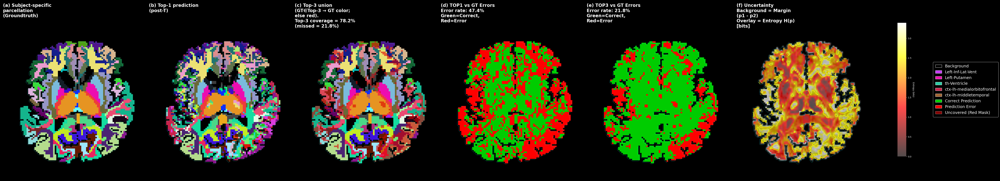

In [16]:
# ====================== 六联图：无总标题，面板内标题 + 右侧全局色条 + 错误可视化 ======================
import numpy as np
import matplotlib.pyplot as plt
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=22, width=24, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    label_rgb = np.zeros((H, W, 3), dtype=float)
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    - gt_map: ground truth标签
    - pred_map: 预测标签 (TOP1) 或者 None (如果是TOP3)
    - mask: ROI mask
    - top3_union_correct: 对于TOP3情况，传入TOP3并集是否正确的布尔数组
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：黑色背景
    error_rgb = np.zeros((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        # 错误区域显示为红色
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        # 错误区域显示为红色  
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ---------- 画布：改为6个子图 ----------
fig, axes = plt.subplots(1, 6, figsize=(70, 12), constrained_layout=False)
fig.patch.set_facecolor('black')

# ---------- (a) Groundtruth ----------
plot_categorical_map(
    axes[0], ref_mode, mask_slice,
    '(a) Subject-specific parcellation (Groundtruth)'
)

# ---------- (b) Top-1 ----------
plot_categorical_map(
    axes[1], pred_top1, mask_slice,
    '(b) Top-1 prediction (post-T)'
)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(
    axes[2], ref_mode, mask_slice,
    f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
    f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
    show_red_mask=True, red_mask_data=red_mask
)

# ---------- (d) TOP1错误可视化 ----------
top1_error_rgb, top1_error_rate = plot_error_map(axes[3], ref_mode, pred_top1, mask_slice)

H, W = ref_mode.shape
extent = (0, W, 0, H)
axes[3].imshow(top1_error_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
axes[3].contour(X, Y, mask_slice.astype(float), levels=[0.5],
                colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
axes[3].axis('off')

# ---------- (e) TOP3错误可视化 ----------
# red_mask表示GT不在TOP3中的位置，所以~red_mask表示GT在TOP3中
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(axes[4], ref_mode, None, mask_slice, top3_correct)

axes[4].imshow(top3_error_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

# ROI轮廓
axes[4].contour(X, Y, mask_slice.astype(float), levels=[0.5],
                colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
axes[4].axis('off')

# ---------- (f) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (f) 底图与叠加：统一坐标（extent + origin='lower'）
axes[5].imshow(margin_norm, cmap='gray', origin='lower',
               interpolation='bilinear', vmin=0, vmax=1, extent=extent)

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = axes[5].imshow(entropy_masked, cmap='hot', origin='lower',
                    interpolation='bilinear', alpha=0.70,
                    vmin=0.0, vmax=ent_vmax, extent=extent)

axes[5].contour(X, Y, mask_slice.astype(float), levels=[0.5],
                colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    axes[5].contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                    colors='yellow', linewidths=2.0, alpha=0.85)

# ---------- 面板标题（调整字号以适应更多面板） ----------
panel_title(axes[0], '(a) Subject-specific parcellation (Groundtruth)', fontsize=20, width=22)
panel_title(axes[1], '(b) Top-1 prediction (post-T)', fontsize=20, width=22)
panel_title(axes[2],
            f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\n'
            f'Top-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)',
            fontsize=20, width=22)
panel_title(axes[3],
            f'(d) TOP1 vs GT Errors\n'
            f'Error rate: {top1_error_rate:.1f}%\n'
            f'Green=Correct, Red=Error',
            fontsize=20, width=22)
panel_title(axes[4],
            f'(e) TOP3 vs GT Errors\n'
            f'Error rate: {top3_error_rate:.1f}%\n'
            f'Green=Correct, Red=Error',
            fontsize=20, width=22)
panel_title(axes[5],
            '(f) Uncertainty\nBackground = Margin (p1 - p2)\n'
            f'Overlay = Entropy H(p) [{entropy_unit_label}]',
            fontsize=20, width=22)
axes[5].axis('off')

# ---------- 右侧图例 ----------
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# ---------- 布局留白 + 右侧全局色条 ----------
# 给右侧留更宽的边，调整left以适应6个面板
fig.subplots_adjust(left=0.02, right=0.80, top=0.96, bottom=0.03, wspace=0.015)

# 色条位置调整
cax = fig.add_axes([0.82, 0.15, 0.008, 0.70])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=14,
               color='white', fontsize=10)
cbar.ax.tick_params(colors='white', labelsize=10)

# 图例位置调整
fig.legend(
    handles=legend_handles,
    loc='center left',
    bbox_to_anchor=(0.85, 0.5),   
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=18, labelcolor='white',  
    borderpad=0.6, labelspacing=0.5, handlelength=1.6
)

plt.show()

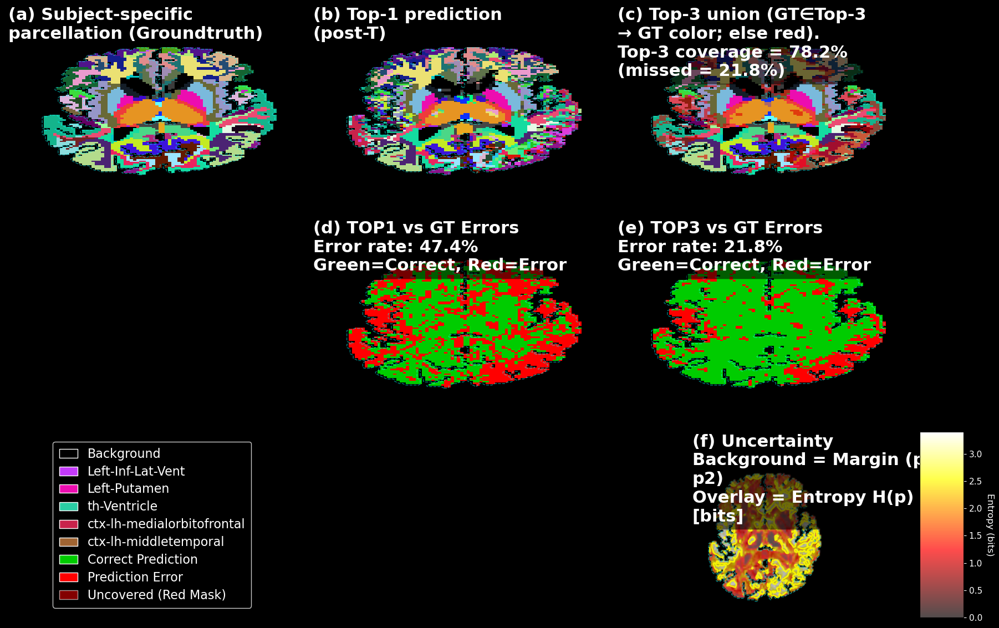

In [17]:
# ====================== 六联图：2D布局 + 错误可视化 ======================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=22, width=26, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    label_rgb = np.zeros((H, W, 3), dtype=float)
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    - gt_map: ground truth标签
    - pred_map: 预测标签 (TOP1) 或者 None (如果是TOP3)
    - mask: ROI mask
    - top3_union_correct: 对于TOP3情况，传入TOP3并集是否正确的布尔数组
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：黑色背景
    error_rgb = np.zeros((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        # 错误区域显示为红色
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        # 错误区域显示为红色  
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ---------- 创建2D布局 ----------
fig = plt.figure(figsize=(18, 12))
fig.patch.set_facecolor('black')

# 使用GridSpec创建复杂布局
gs = gridspec.GridSpec(3, 4, figure=fig, 
                       width_ratios=[1, 1, 1, 0.15],  # 最后一列给colorbar
                       height_ratios=[1, 1, 1],
                       left=0.02, right=0.98, top=0.96, bottom=0.04,
                       wspace=0.05, hspace=0.15)

# 第一行: a, b, c
ax_a = fig.add_subplot(gs[0, 0])  # (a) GT
ax_b = fig.add_subplot(gs[0, 1])  # (b) TOP1
ax_c = fig.add_subplot(gs[0, 2])  # (c) TOP3

# 第二行: 空, d(b下), e(c下)
ax_d = fig.add_subplot(gs[1, 1])  # (d) TOP1 errors
ax_e = fig.add_subplot(gs[1, 2])  # (e) TOP3 errors

# 第三行: legend(a下), 空, f(e下), colorbar
ax_legend = fig.add_subplot(gs[2, 0])  # FreeSurfer labels legend
ax_f = fig.add_subplot(gs[2, 2])  # (f) Uncertainty
ax_colorbar = fig.add_subplot(gs[2, 3])  # Colorbar

# ---------- (a) Groundtruth ----------
plot_categorical_map(ax_a, ref_mode, mask_slice)

# ---------- (b) Top-1 ----------
plot_categorical_map(ax_b, pred_top1, mask_slice)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(ax_c, ref_mode, mask_slice, show_red_mask=True, red_mask_data=red_mask)

# ---------- (d) TOP1错误可视化 ----------
top1_error_rgb, top1_error_rate = plot_error_map(ax_d, ref_mode, pred_top1, mask_slice)

H, W = ref_mode.shape
extent = (0, W, 0, H)
ax_d.imshow(top1_error_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
ax_d.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_d.axis('off')

# ---------- (e) TOP3错误可视化 ----------
# red_mask表示GT不在TOP3中的位置，所以~red_mask表示GT在TOP3中
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(ax_e, ref_mode, None, mask_slice, top3_correct)

ax_e.imshow(top3_error_rgb, origin='lower', interpolation='nearest', aspect='auto', extent=extent)

# ROI轮廓
ax_e.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_e.axis('off')

# ---------- (f) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (f) 底图与叠加：统一坐标（extent + origin='lower'）
ax_f.imshow(margin_norm, cmap='gray', origin='lower',
            interpolation='bilinear', vmin=0, vmax=1, extent=extent)

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = ax_f.imshow(entropy_masked, cmap='hot', origin='lower',
                 interpolation='bilinear', alpha=0.70,
                 vmin=0.0, vmax=ent_vmax, extent=extent)

ax_f.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    ax_f.contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                 colors='yellow', linewidths=2.0, alpha=0.85)
ax_f.axis('off')

# ---------- 面板标题 ----------
panel_title(ax_a, '(a) Subject-specific parcellation (Groundtruth)', fontsize=22, width=26)
panel_title(ax_b, '(b) Top-1 prediction (post-T)', fontsize=22, width=26)
panel_title(ax_c, f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\nTop-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)', fontsize=22, width=26)
panel_title(ax_d, f'(d) TOP1 vs GT Errors\nError rate: {top1_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=22, width=26)
panel_title(ax_e, f'(e) TOP3 vs GT Errors\nError rate: {top3_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=22, width=26)
panel_title(ax_f, f'(f) Uncertainty\nBackground = Margin (p1 - p2)\nOverlay = Entropy H(p) [{entropy_unit_label}]', fontsize=22, width=26)

# ---------- FreeSurfer标签图例（左下角） ----------
# 在ax_legend位置放置FreeSurfer标签
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# 在左下角绘制图例
ax_legend.legend(
    handles=legend_handles,
    loc='center',
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=16, labelcolor='white',
    borderpad=0.5, labelspacing=0.4, handlelength=1.5,
    ncol=1
)
ax_legend.axis('off')

# ---------- 右侧色条 ----------
# 在ax_colorbar位置放置色条
cbar = plt.colorbar(im, cax=ax_colorbar)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=15,
               color='white', fontsize=12)
cbar.ax.tick_params(colors='white', labelsize=11)

plt.show()

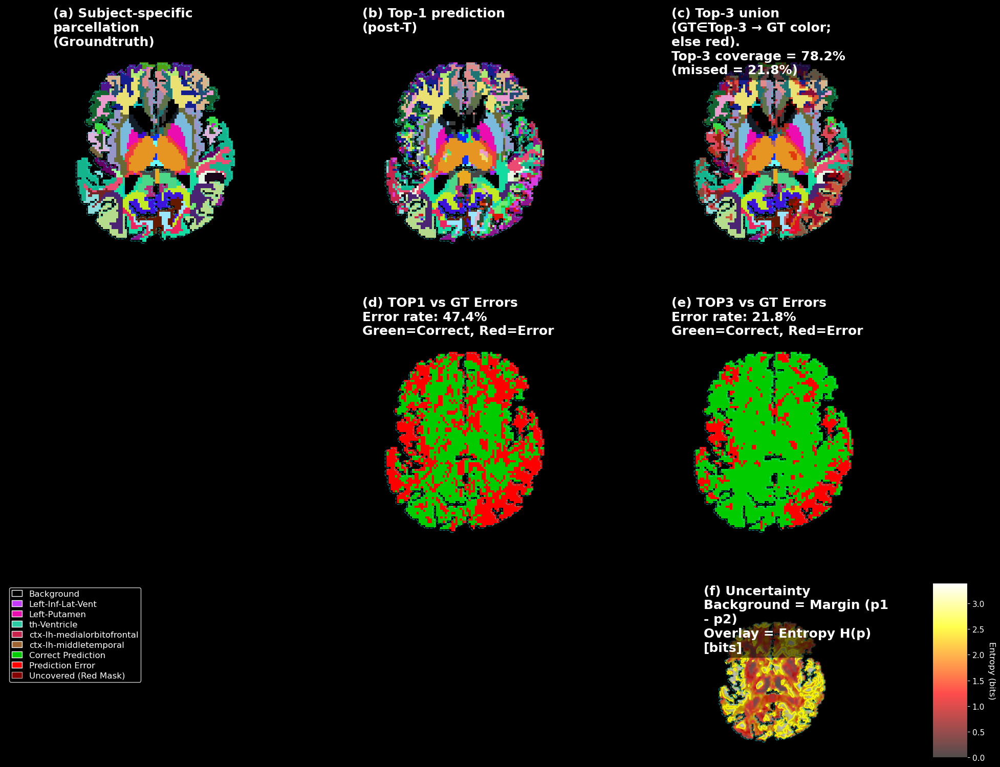

In [18]:
# ====================== 六联图：2D布局 + 错误可视化 ======================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=22, width=26, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    label_rgb = np.zeros((H, W, 3), dtype=float)
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin，保持比例）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    - gt_map: ground truth标签
    - pred_map: 预测标签 (TOP1) 或者 None (如果是TOP3)
    - mask: ROI mask
    - top3_union_correct: 对于TOP3情况，传入TOP3并集是否正确的布尔数组
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：黑色背景
    error_rgb = np.zeros((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        # 错误区域显示为红色
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        # 错误区域显示为红色  
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ---------- 创建2D布局 ----------
fig = plt.figure(figsize=(20, 16))  # 增加高度以保持比例
fig.patch.set_facecolor('black')

# 使用GridSpec创建复杂布局，调整比例以保持图像宽高比
gs = gridspec.GridSpec(3, 4, figure=fig, 
                       width_ratios=[1, 1, 1, 0.12],  # 最后一列给colorbar，减小宽度
                       height_ratios=[1.2, 1.2, 0.8],  # 前两行给图像更多空间，最后一行给图例
                       left=0.02, right=0.96, top=0.96, bottom=0.04,
                       wspace=0.08, hspace=0.12)

# 第一行: a, b, c
ax_a = fig.add_subplot(gs[0, 0])  # (a) GT
ax_b = fig.add_subplot(gs[0, 1])  # (b) TOP1
ax_c = fig.add_subplot(gs[0, 2])  # (c) TOP3

# 第二行: 空, d(b下), e(c下)
ax_d = fig.add_subplot(gs[1, 1])  # (d) TOP1 errors
ax_e = fig.add_subplot(gs[1, 2])  # (e) TOP3 errors

# 第三行: legend(a下), 空, f(e下), colorbar
ax_legend = fig.add_subplot(gs[2, 0])  # FreeSurfer labels legend
ax_f = fig.add_subplot(gs[2, 2])  # (f) Uncertainty
ax_colorbar = fig.add_subplot(gs[2, 3])  # Colorbar

# ---------- (a) Groundtruth ----------
plot_categorical_map(ax_a, ref_mode, mask_slice)

# ---------- (b) Top-1 ----------
plot_categorical_map(ax_b, pred_top1, mask_slice)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(ax_c, ref_mode, mask_slice, show_red_mask=True, red_mask_data=red_mask)

# ---------- (d) TOP1错误可视化 ----------
top1_error_rgb, top1_error_rate = plot_error_map(ax_d, ref_mode, pred_top1, mask_slice)

H, W = ref_mode.shape
extent = (0, W, 0, H)
ax_d.imshow(top1_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
ax_d.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_d.axis('off')

# ---------- (e) TOP3错误可视化 ----------
# red_mask表示GT不在TOP3中的位置，所以~red_mask表示GT在TOP3中
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(ax_e, ref_mode, None, mask_slice, top3_correct)

ax_e.imshow(top3_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
ax_e.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_e.axis('off')

# ---------- (f) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (f) 底图与叠加：统一坐标（extent + origin='lower'），保持比例
ax_f.imshow(margin_norm, cmap='gray', origin='lower',
            interpolation='bilinear', vmin=0, vmax=1, extent=extent, aspect='equal')

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = ax_f.imshow(entropy_masked, cmap='hot', origin='lower',
                 interpolation='bilinear', alpha=0.70,
                 vmin=0.0, vmax=ent_vmax, extent=extent, aspect='equal')

ax_f.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    ax_f.contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                 colors='yellow', linewidths=2.0, alpha=0.85)
ax_f.axis('off')

# ---------- 面板标题 ----------
panel_title(ax_a, '(a) Subject-specific parcellation (Groundtruth)', fontsize=18, width=24)
panel_title(ax_b, '(b) Top-1 prediction (post-T)', fontsize=18, width=24)
panel_title(ax_c, f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\nTop-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)', fontsize=18, width=24)
panel_title(ax_d, f'(d) TOP1 vs GT Errors\nError rate: {top1_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=18, width=24)
panel_title(ax_e, f'(e) TOP3 vs GT Errors\nError rate: {top3_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=18, width=24)
panel_title(ax_f, f'(f) Uncertainty\nBackground = Margin (p1 - p2)\nOverlay = Entropy H(p) [{entropy_unit_label}]', fontsize=18, width=24)

# ---------- FreeSurfer标签图例（左下角） ----------
# 在ax_legend位置放置FreeSurfer标签
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# 在左下角绘制图例
ax_legend.legend(
    handles=legend_handles,
    loc='upper left',
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=12, labelcolor='white',
    borderpad=0.3, labelspacing=0.3, handlelength=1.2,
    ncol=1, columnspacing=0.5
)
ax_legend.axis('off')

# ---------- 右侧色条 ----------
# 在ax_colorbar位置放置色条
cbar = plt.colorbar(im, cax=ax_colorbar)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=15,
               color='white', fontsize=12)
cbar.ax.tick_params(colors='white', labelsize=11)

plt.show()

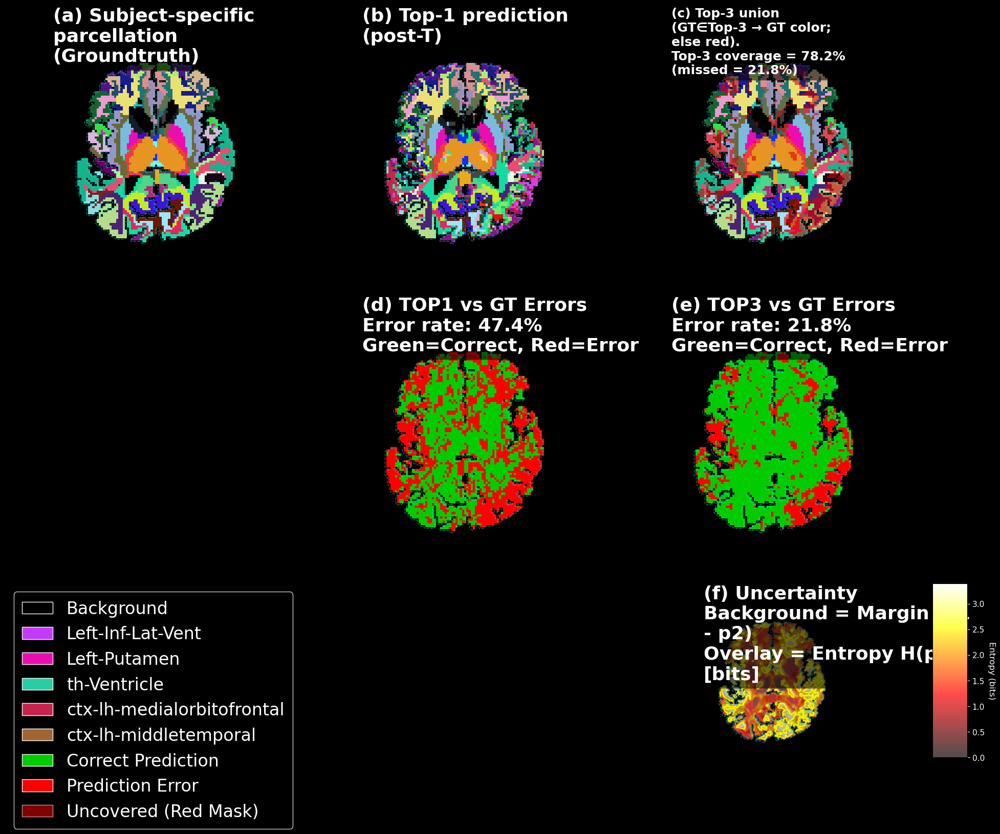

In [19]:
# ====================== 六联图：2D布局 + 错误可视化 ======================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=22, width=26, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    label_rgb = np.zeros((H, W, 3), dtype=float)
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin，保持比例）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    - gt_map: ground truth标签
    - pred_map: 预测标签 (TOP1) 或者 None (如果是TOP3)
    - mask: ROI mask
    - top3_union_correct: 对于TOP3情况，传入TOP3并集是否正确的布尔数组
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：黑色背景
    error_rgb = np.zeros((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        # 错误区域显示为红色
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        # 错误区域显示为红色  
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ---------- 创建2D布局 ----------
fig = plt.figure(figsize=(20, 16))  # 增加高度以保持比例
fig.patch.set_facecolor('black')

# 使用GridSpec创建复杂布局，调整比例以保持图像宽高比
gs = gridspec.GridSpec(3, 4, figure=fig, 
                       width_ratios=[1, 1, 1, 0.12],  # 最后一列给colorbar，减小宽度
                       height_ratios=[1.2, 1.2, 0.8],  # 前两行给图像更多空间，最后一行给图例
                       left=0.02, right=0.96, top=0.96, bottom=0.04,
                       wspace=0.08, hspace=0.12)

# 第一行: a, b, c
ax_a = fig.add_subplot(gs[0, 0])  # (a) GT
ax_b = fig.add_subplot(gs[0, 1])  # (b) TOP1
ax_c = fig.add_subplot(gs[0, 2])  # (c) TOP3

# 第二行: 空, d(b下), e(c下)
ax_d = fig.add_subplot(gs[1, 1])  # (d) TOP1 errors
ax_e = fig.add_subplot(gs[1, 2])  # (e) TOP3 errors

# 第三行: legend(a下), 空, f(e下), colorbar
ax_legend = fig.add_subplot(gs[2, 0])  # FreeSurfer labels legend
ax_f = fig.add_subplot(gs[2, 2])  # (f) Uncertainty
ax_colorbar = fig.add_subplot(gs[2, 3])  # Colorbar

# ---------- (a) Groundtruth ----------
plot_categorical_map(ax_a, ref_mode, mask_slice)

# ---------- (b) Top-1 ----------
plot_categorical_map(ax_b, pred_top1, mask_slice)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(ax_c, ref_mode, mask_slice, show_red_mask=True, red_mask_data=red_mask)

# ---------- (d) TOP1错误可视化 ----------
top1_error_rgb, top1_error_rate = plot_error_map(ax_d, ref_mode, pred_top1, mask_slice)

H, W = ref_mode.shape
extent = (0, W, 0, H)
ax_d.imshow(top1_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
ax_d.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_d.axis('off')

# ---------- (e) TOP3错误可视化 ----------
# red_mask表示GT不在TOP3中的位置，所以~red_mask表示GT在TOP3中
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(ax_e, ref_mode, None, mask_slice, top3_correct)

ax_e.imshow(top3_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
ax_e.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_e.axis('off')

# ---------- (f) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (f) 底图与叠加：统一坐标（extent + origin='lower'），保持比例
ax_f.imshow(margin_norm, cmap='gray', origin='lower',
            interpolation='bilinear', vmin=0, vmax=1, extent=extent, aspect='equal')

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = ax_f.imshow(entropy_masked, cmap='hot', origin='lower',
                 interpolation='bilinear', alpha=0.70,
                 vmin=0.0, vmax=ent_vmax, extent=extent, aspect='equal')

ax_f.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    ax_f.contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                 colors='yellow', linewidths=2.0, alpha=0.85)
ax_f.axis('off')

# ---------- 面板标题 ----------
panel_title(ax_a, '(a) Subject-specific parcellation (Groundtruth)', fontsize=26, width=24)
panel_title(ax_b, '(b) Top-1 prediction (post-T)', fontsize=26, width=24)
panel_title(ax_c, f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\nTop-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)', fontsize=18, width=24)
panel_title(ax_d, f'(d) TOP1 vs GT Errors\nError rate: {top1_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=26, width=24)
panel_title(ax_e, f'(e) TOP3 vs GT Errors\nError rate: {top3_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=26, width=24)
panel_title(ax_f, f'(f) Uncertainty\nBackground = Margin (p1 - p2)\nOverlay = Entropy H(p) [{entropy_unit_label}]', fontsize=26, width=24)

# ---------- FreeSurfer标签图例（左下角） ----------
# 在ax_legend位置放置FreeSurfer标签
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# 在左下角绘制图例
ax_legend.legend(
    handles=legend_handles,
    loc='upper left',
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=24, labelcolor='white',  # 放大一倍：从12到24
    borderpad=0.5, labelspacing=0.5, handlelength=1.8,
    ncol=1, columnspacing=0.8
)
ax_legend.axis('off')

# ---------- 右侧色条 ----------
# 在ax_colorbar位置放置色条
cbar = plt.colorbar(im, cax=ax_colorbar)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=15,
               color='white', fontsize=12)
cbar.ax.tick_params(colors='white', labelsize=11)

plt.show()

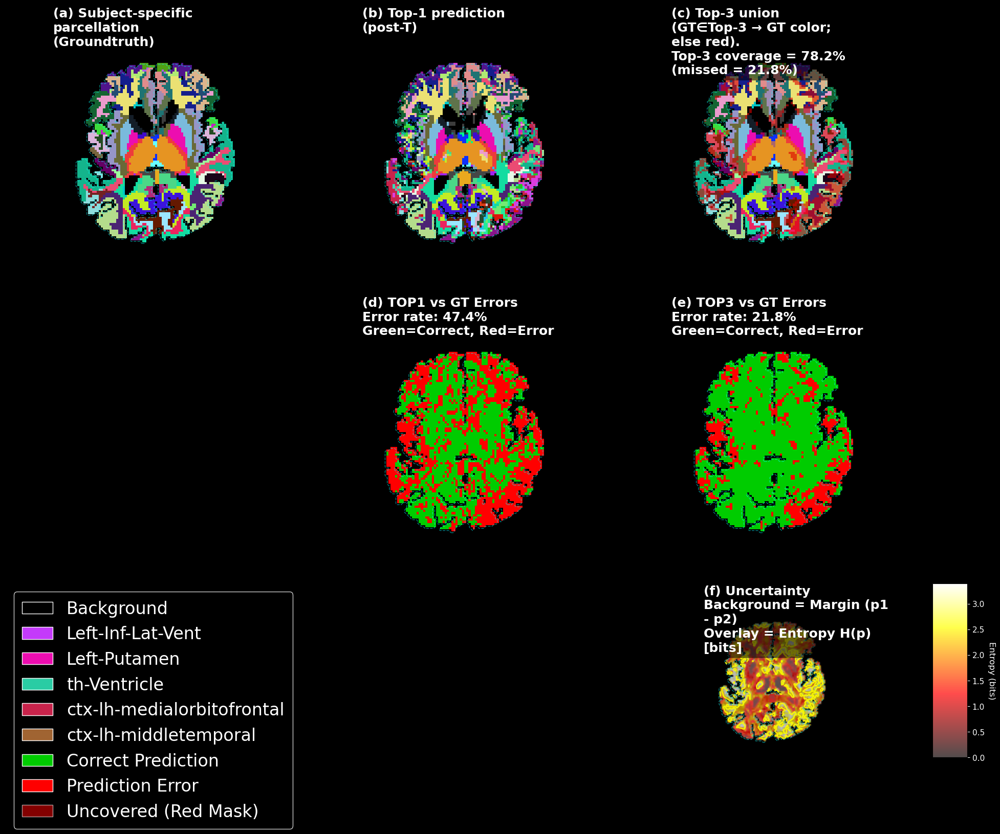

In [20]:
# ====================== 六联图：2D布局 + 错误可视化 ======================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=22, width=26, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='white',
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(0,0,0,0.55), edgecolor='none'),
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    label_rgb = np.zeros((H, W, 3), dtype=float)
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin，保持比例）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    - gt_map: ground truth标签
    - pred_map: 预测标签 (TOP1) 或者 None (如果是TOP3)
    - mask: ROI mask
    - top3_union_correct: 对于TOP3情况，传入TOP3并集是否正确的布尔数组
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：黑色背景
    error_rgb = np.zeros((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        # 错误区域显示为红色
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        # 错误区域显示为红色  
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        # 正确区域显示为绿色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        # 计算错误率
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ---------- 创建2D布局 ----------
fig = plt.figure(figsize=(20, 16))  # 增加高度以保持比例
fig.patch.set_facecolor('black')

# 使用GridSpec创建复杂布局，调整比例以保持图像宽高比
gs = gridspec.GridSpec(3, 4, figure=fig, 
                       width_ratios=[1, 1, 1, 0.12],  # 最后一列给colorbar，减小宽度
                       height_ratios=[1.2, 1.2, 0.8],  # 前两行给图像更多空间，最后一行给图例
                       left=0.02, right=0.96, top=0.96, bottom=0.04,
                       wspace=0.08, hspace=0.12)

# 第一行: a, b, c
ax_a = fig.add_subplot(gs[0, 0])  # (a) GT
ax_b = fig.add_subplot(gs[0, 1])  # (b) TOP1
ax_c = fig.add_subplot(gs[0, 2])  # (c) TOP3

# 第二行: 空, d(b下), e(c下)
ax_d = fig.add_subplot(gs[1, 1])  # (d) TOP1 errors
ax_e = fig.add_subplot(gs[1, 2])  # (e) TOP3 errors

# 第三行: legend(a下), 空, f(e下), colorbar
ax_legend = fig.add_subplot(gs[2, 0])  # FreeSurfer labels legend
ax_f = fig.add_subplot(gs[2, 2])  # (f) Uncertainty
ax_colorbar = fig.add_subplot(gs[2, 3])  # Colorbar

# ---------- (a) Groundtruth ----------
plot_categorical_map(ax_a, ref_mode, mask_slice)

# ---------- (b) Top-1 ----------
plot_categorical_map(ax_b, pred_top1, mask_slice)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(ax_c, ref_mode, mask_slice, show_red_mask=True, red_mask_data=red_mask)

# ---------- (d) TOP1错误可视化 ----------
top1_error_rgb, top1_error_rate = plot_error_map(ax_d, ref_mode, pred_top1, mask_slice)

H, W = ref_mode.shape
extent = (0, W, 0, H)
ax_d.imshow(top1_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
ax_d.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_d.axis('off')

# ---------- (e) TOP3错误可视化 ----------
# red_mask表示GT不在TOP3中的位置，所以~red_mask表示GT在TOP3中
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(ax_e, ref_mode, None, mask_slice, top3_correct)

ax_e.imshow(top3_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
ax_e.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_e.axis('off')

# ---------- (f) Uncertainty: Margin + Entropy ----------
# 若已有 margin / entropy_map，可直接替换计算段
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    margin_norm[~roi] = 0.0
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# (f) 底图与叠加：统一坐标（extent + origin='lower'），保持比例
ax_f.imshow(margin_norm, cmap='gray', origin='lower',
            interpolation='bilinear', vmin=0, vmax=1, extent=extent, aspect='equal')

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = ax_f.imshow(entropy_masked, cmap='hot', origin='lower',
                 interpolation='bilinear', alpha=0.70,
                 vmin=0.0, vmax=ent_vmax, extent=extent, aspect='equal')

ax_f.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    ax_f.contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                 colors='yellow', linewidths=2.0, alpha=0.85)
ax_f.axis('off')

# ---------- 面板标题 ----------
panel_title(ax_a, '(a) Subject-specific parcellation (Groundtruth)', fontsize=18, width=24)
panel_title(ax_b, '(b) Top-1 prediction (post-T)', fontsize=18, width=24)
panel_title(ax_c, f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\nTop-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)', fontsize=18, width=24)
panel_title(ax_d, f'(d) TOP1 vs GT Errors\nError rate: {top1_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=18, width=24)
panel_title(ax_e, f'(e) TOP3 vs GT Errors\nError rate: {top3_error_rate:.1f}%\nGreen=Correct, Red=Error', fontsize=18, width=24)
panel_title(ax_f, f'(f) Uncertainty\nBackground = Margin (p1 - p2)\nOverlay = Entropy H(p) [{entropy_unit_label}]', fontsize=18, width=24)

# ---------- FreeSurfer标签图例（左下角） ----------
# 在ax_legend位置放置FreeSurfer标签
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# 在左下角绘制图例
ax_legend.legend(
    handles=legend_handles,
    loc='upper left',
    frameon=True, facecolor='black', edgecolor='white',
    fontsize=24, labelcolor='white',  # 放大一倍：从12到24
    borderpad=0.5, labelspacing=0.5, handlelength=1.8,
    ncol=1, columnspacing=0.8
)
ax_legend.axis('off')

# ---------- 右侧色条 ----------
# 在ax_colorbar位置放置色条
cbar = plt.colorbar(im, cax=ax_colorbar)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=15,
               color='white', fontsize=12)
cbar.ax.tick_params(colors='white', labelsize=11)

plt.show()

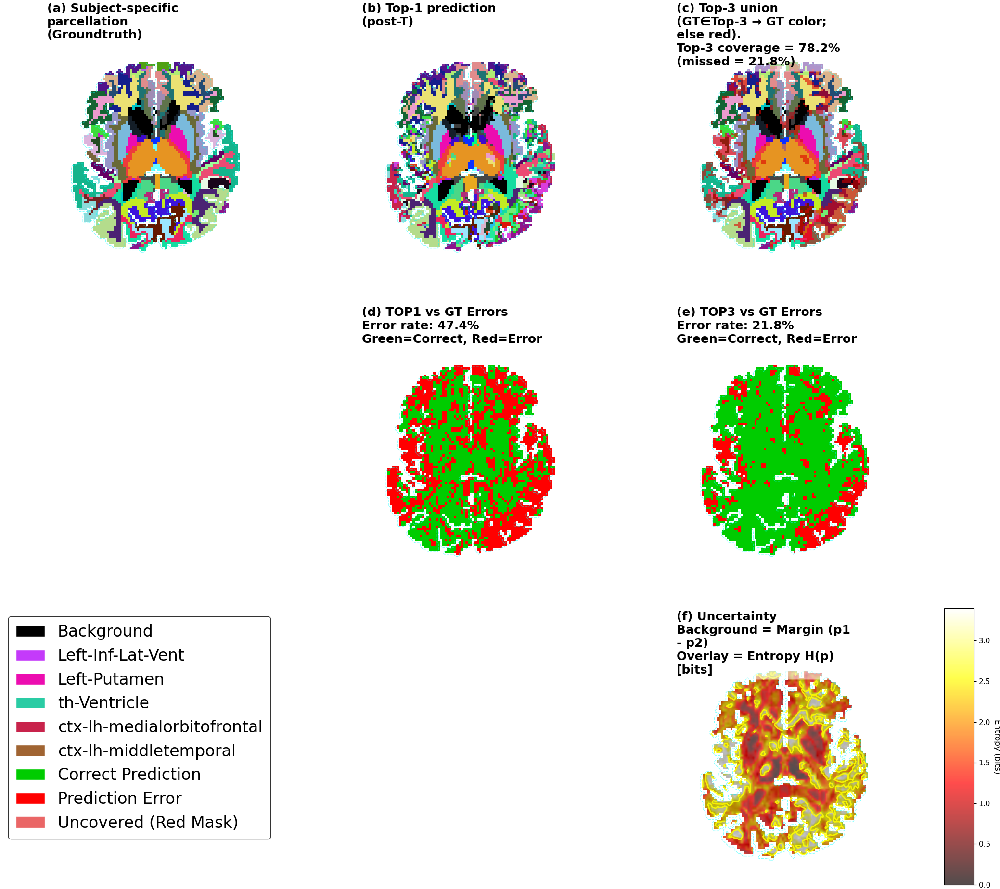

In [28]:
# ====================== 六联图：2D布局 + 错误可视化 (修正熵图尺寸) ======================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=18, width=24, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='black',  # <--- 修改：黑色文字
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(1,1,1,0.55), edgecolor='none'), # <--- 修改：半透明白色背景框
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    # <--- 修改：初始化为全白 (np.ones)
    label_rgb = np.ones((H, W, 3), dtype=float) 
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin，保持比例）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：白色背景
    # <--- 修改：初始化为全白 (np.ones)
    error_rgb = np.ones((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ========== 重要：创建2D布局，确保所有图像尺寸一致 ==========
fig = plt.figure(figsize=(22, 20))  # 进一步增加尺寸
fig.patch.set_facecolor('white')    # <--- 修改：背景设为白色

# 关键修改：所有行使用相同的height_ratio，确保熵图不被压缩
gs = gridspec.GridSpec(3, 4, figure=fig, 
                       width_ratios=[1.0, 1.0, 1.0, 0.1],  # 前三列等宽，最后一列给colorbar
                       height_ratios=[1.0, 1.0, 1.0],      # *** 关键：所有行相同高度 ***
                       left=0.02, right=0.94, top=0.96, bottom=0.04,
                       wspace=0.06, hspace=0.10)

# 第一行: a, b, c
ax_a = fig.add_subplot(gs[0, 0])  # (a) GT
ax_b = fig.add_subplot(gs[0, 1])  # (b) TOP1
ax_c = fig.add_subplot(gs[0, 2])  # (c) TOP3

# 第二行: 空, d(b下), e(c下)
ax_d = fig.add_subplot(gs[1, 1])  # (d) TOP1 errors
ax_e = fig.add_subplot(gs[1, 2])  # (e) TOP3 errors

# 第三行: legend(a下), 空, f(e下), colorbar
ax_legend = fig.add_subplot(gs[2, 0])  # FreeSurfer labels legend
ax_f = fig.add_subplot(gs[2, 2])  # (f) Uncertainty - *** 关键：与其他图相同尺寸 ***
ax_colorbar = fig.add_subplot(gs[2, 3])  # Colorbar

# ---------- (a) Groundtruth ----------
plot_categorical_map(ax_a, ref_mode, mask_slice)

# ---------- (b) Top-1 ----------
plot_categorical_map(ax_b, pred_top1, mask_slice)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(ax_c, ref_mode, mask_slice, show_red_mask=True, red_mask_data=red_mask)

# ---------- (d) TOP1错误可视化 ----------
top1_error_rgb, top1_error_rate = plot_error_map(ax_d, ref_mode, pred_top1, mask_slice)

H, W = ref_mode.shape
extent = (0, W, 0, H)
ax_d.imshow(top1_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
ax_d.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_d.axis('off')

# ---------- (e) TOP3错误可视化 ----------
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(ax_e, ref_mode, None, mask_slice, top3_correct)

ax_e.imshow(top3_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)
ax_e.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_e.axis('off')

# ========== (f) 关键修正：熵图尺寸与其他子图一致 ==========
# 计算不确定性指标
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    # margin_norm[~roi] = 0.0  <--- 删除旧的黑色背景设置
    margin_norm = np.ma.masked_where(~roi, margin_norm) # <--- 修改：使用Mask隐藏背景
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# *** 关键：确保熵图使用aspect='equal'且与其他图像相同的extent ***
ax_f.imshow(margin_norm, cmap='gray', origin='lower',
            interpolation='bilinear', vmin=0, vmax=1, 
            extent=extent, aspect='equal')  # <-- 关键设置

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = ax_f.imshow(entropy_masked, cmap='hot', origin='lower',
                 interpolation='bilinear', alpha=0.70,
                 vmin=0.0, vmax=ent_vmax, 
                 extent=extent, aspect='equal')  # <-- 关键设置

# ROI轮廓和等高线
ax_f.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    ax_f.contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                 colors='yellow', linewidths=2.0, alpha=0.85)
ax_f.axis('off')

# ---------- 面板标题 ----------
panel_title(ax_a, '(a) Subject-specific parcellation (Groundtruth)')
panel_title(ax_b, '(b) Top-1 prediction (post-T)')
panel_title(ax_c, f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\nTop-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)')
panel_title(ax_d, f'(d) TOP1 vs GT Errors\nError rate: {top1_error_rate:.1f}%\nGreen=Correct, Red=Error')
panel_title(ax_e, f'(e) TOP3 vs GT Errors\nError rate: {top3_error_rate:.1f}%\nGreen=Correct, Red=Error')
panel_title(ax_f, f'(f) Uncertainty\nBackground = Margin (p1 - p2)\nOverlay = Entropy H(p) [{entropy_unit_label}]')

# ---------- FreeSurfer标签图例（左下角） ----------
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# 在左下角绘制图例
ax_legend.legend(
    handles=legend_handles,
    loc='upper left',
    frameon=True, 
    facecolor='white', edgecolor='black',   # <--- 修改：白色背景，黑色边框
    fontsize=24, 
    labelcolor='black',                     # <--- 修改：黑色文字
    borderpad=0.5, labelspacing=0.5, handlelength=1.8,
    ncol=1, columnspacing=0.8
)
ax_legend.axis('off')

# ---------- 右侧色条 ----------
cbar = plt.colorbar(im, cax=ax_colorbar)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=15,
               color='black', fontsize=12)  # <--- 修改：黑色文字
cbar.ax.tick_params(colors='black', labelsize=11)  # <--- 修改：黑色刻度

plt.show()

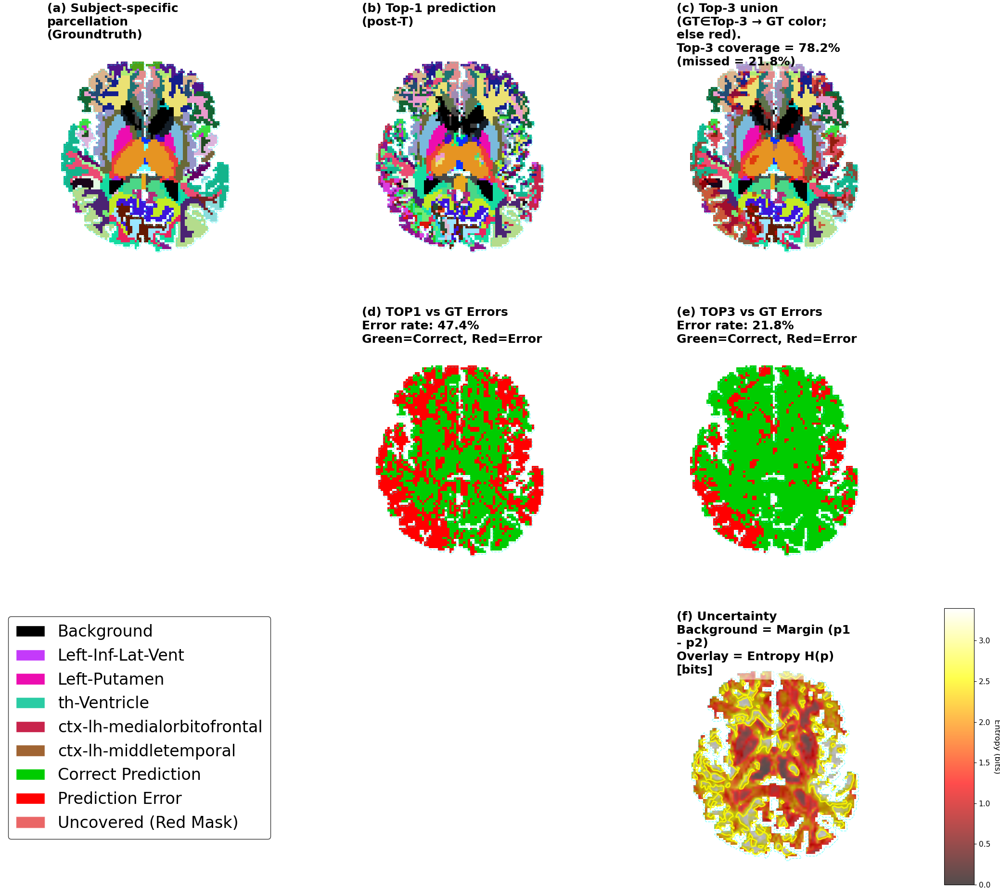

In [29]:
# ====================== 六联图：2D布局 + 错误可视化 (修正熵图尺寸) ======================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import textwrap
from matplotlib.patches import Patch

# ---------- 配置：熵单位 ----------
# 选 "bits" 或 "nats"
ENTROPY_UNIT = "bits"

# ---------- 工具函数（只保留这一份） ----------
def panel_title(ax, s, fontsize=18, width=24, x=0.01, y=0.99):
    """面板内标题：可调字号与换行宽度；只在外部调用一次，避免重复"""
    lines = s.split('\n')
    wrapped = [textwrap.fill(line, width=width) if line.strip() else '' for line in lines]
    s2 = '\n'.join(wrapped)
    ax.text(
        x, y, s2, transform=ax.transAxes, va='top', ha='left',
        fontsize=fontsize, fontweight='bold', color='black',  # <--- 黑色文字
        bbox=dict(boxstyle='round,pad=0.3', facecolor=(1,1,1,0.55), edgecolor='none'), # <--- 半透明白色背景
        multialignment='left'
    )

def plot_categorical_map(ax, label_map, mask, title=None, show_red_mask=False, red_mask_data=None):
    """
    分类图绘制：统一坐标（origin='lower' + extent），轮廓用 X,Y 网格（不再 flip）
    仅绘图，不在函数内写标题（避免重复）
    """
    H, W = label_map.shape
    extent = (0, W, 0, H)

    # LUT 着色
    # <--- 初始化为全白 (np.ones)
    label_rgb = np.ones((H, W, 3), dtype=float) 
    for class_idx in range(N_CLASSES):
        class_mask = (label_map == class_idx) & (mask > 0)
        if np.any(class_mask):
            label_rgb[class_mask] = LABEL_COLORS_RGB.get(class_idx, (0, 0, 0))

    # 主图 + 可选红遮罩（统一 extent / origin，保持比例）
    ax.imshow(label_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)
    if show_red_mask and red_mask_data is not None:
        red_overlay = np.zeros((H, W, 4), dtype=float)
        red_overlay[red_mask_data] = RED_MASK_COLOR
        ax.imshow(red_overlay, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

    # ROI 轮廓（与 imshow 对齐）
    Y, X = np.mgrid[0:H, 0:W]
    ax.contour(X, Y, mask.astype(float), levels=[0.5],
               colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
    ax.axis('off')

def plot_error_map(ax, gt_map, pred_map, mask, top3_union_correct=None):
    """
    错误可视化：显示预测错误的区域
    """
    H, W = gt_map.shape
    extent = (0, W, 0, H)
    
    # 创建错误图：白色背景
    # <--- 初始化为全白 (np.ones)
    error_rgb = np.ones((H, W, 3), dtype=float)
    
    roi = mask > 0
    
    if pred_map is not None:
        # TOP1 错误：pred_map != gt_map
        error_mask = roi & (pred_map != gt_map)
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        correct_mask = roi & (pred_map == gt_map)
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    elif top3_union_correct is not None:
        # TOP3 错误：GT不在TOP3中
        error_mask = roi & (~top3_union_correct)
        error_rgb[error_mask] = [1.0, 0.0, 0.0]  # 红色
        correct_mask = roi & top3_union_correct
        error_rgb[correct_mask] = [0.0, 0.8, 0.0]  # 绿色
        
        if roi.any():
            error_rate = np.sum(error_mask) / np.sum(roi) * 100
        else:
            error_rate = 0.0
            
        return error_rgb, error_rate
    
    return error_rgb, 0.0

# ========== 重要：创建2D布局，确保所有图像尺寸一致 ==========
fig = plt.figure(figsize=(22, 20))  # 进一步增加尺寸
fig.patch.set_facecolor('white')    # <--- 背景设为白色

# 关键修改：所有行使用相同的height_ratio，确保熵图不被压缩
gs = gridspec.GridSpec(3, 4, figure=fig, 
                       width_ratios=[1.0, 1.0, 1.0, 0.1],  # 前三列等宽，最后一列给colorbar
                       height_ratios=[1.0, 1.0, 1.0],      # *** 关键：所有行相同高度 ***
                       left=0.02, right=0.94, top=0.96, bottom=0.04,
                       wspace=0.06, hspace=0.10)

# 第一行: a, b, c
ax_a = fig.add_subplot(gs[0, 0])  # (a) GT
ax_b = fig.add_subplot(gs[0, 1])  # (b) TOP1
ax_c = fig.add_subplot(gs[0, 2])  # (c) TOP3

# 第二行: 空, d(b下), e(c下)
ax_d = fig.add_subplot(gs[1, 1])  # (d) TOP1 errors
ax_e = fig.add_subplot(gs[1, 2])  # (e) TOP3 errors

# 第三行: legend(a下), 空, f(e下), colorbar
ax_legend = fig.add_subplot(gs[2, 0])  # FreeSurfer labels legend
ax_f = fig.add_subplot(gs[2, 2])  # (f) Uncertainty - *** 关键：与其他图相同尺寸 ***
ax_colorbar = fig.add_subplot(gs[2, 3])  # Colorbar

# ---------- (a) Groundtruth ----------
plot_categorical_map(ax_a, ref_mode, mask_slice)

# ---------- (b) Top-1 ----------
plot_categorical_map(ax_b, pred_top1, mask_slice)

# ---------- (c) Top-3 ∪ + 红遮罩 ----------
coverage = 100.0 - float(red_ratio)
missed = float(red_ratio)
plot_categorical_map(ax_c, ref_mode, mask_slice, show_red_mask=True, red_mask_data=red_mask)

# ---------- (d) TOP1错误可视化 ----------
top1_error_rgb, top1_error_rate = plot_error_map(ax_d, ref_mode, pred_top1, mask_slice)

H, W = ref_mode.shape
extent = (0, W, 0, H)
ax_d.imshow(top1_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)

# ROI轮廓
Y, X = np.mgrid[0:H, 0:W]
ax_d.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_d.axis('off')

# ---------- (e) TOP3错误可视化 ----------
roi = mask_slice > 0
top3_correct = roi & (~red_mask)  # TOP3正确的位置
top3_error_rgb, top3_error_rate = plot_error_map(ax_e, ref_mode, None, mask_slice, top3_correct)

ax_e.imshow(top3_error_rgb, origin='lower', interpolation='nearest', aspect='equal', extent=extent)
ax_e.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)
ax_e.axis('off')

# ========== (f) 关键修正：熵图尺寸与其他子图一致 ==========
# 计算不确定性指标
p_sorted = np.sort(p_pred_slice, axis=-1)
p1, p2 = p_sorted[..., -1], p_sorted[..., -2]
margin_map = p1 - p2

eps = 1e-12
p_safe = np.clip(p_pred_slice, eps, 1.0)
if ENTROPY_UNIT.lower() == "bits":
    entropy_map = -np.sum(p_safe * (np.log(p_safe) / np.log(2.0)), axis=-1)
    entropy_unit_label = "bits"
else:  # nats
    entropy_map = -np.sum(p_safe * np.log(p_safe), axis=-1)
    entropy_unit_label = "nats"

roi = mask_slice > 0
if roi.any():
    margin_min, margin_max = margin_map[roi].min(), margin_map[roi].max()
    margin_norm = (margin_map - margin_min) / (margin_max - margin_min + 1e-8)
    # <--- 修改：使用Mask隐藏背景
    margin_norm = np.ma.masked_where(~roi, margin_norm) 
    ent_roi = entropy_map[roi]
    ent_vmax = np.percentile(ent_roi, 95)
    hi_thr = np.percentile(ent_roi, 75)
else:
    margin_norm = np.zeros_like(margin_map)
    ent_vmax = entropy_map.max() if np.isfinite(entropy_map.max()) else 1.0
    hi_thr = 0.0

# *** 关键：确保熵图使用aspect='equal'且与其他图像相同的extent ***
ax_f.imshow(margin_norm, cmap='gray', origin='lower',
            interpolation='bilinear', vmin=0, vmax=1, 
            extent=extent, aspect='equal')  # <-- 关键设置

entropy_masked = np.ma.masked_where(~roi, entropy_map)
im = ax_f.imshow(entropy_masked, cmap='hot', origin='lower',
                 interpolation='bilinear', alpha=0.70,
                 vmin=0.0, vmax=ent_vmax, 
                 extent=extent, aspect='equal')  # <-- 关键设置

# ROI轮廓和等高线
ax_f.contour(X, Y, mask_slice.astype(float), levels=[0.5],
             colors='cyan', linewidths=1.0, linestyles='--', alpha=0.5)

if roi.any():
    ax_f.contour(X, Y, np.ma.masked_where(~roi, entropy_map), levels=[hi_thr],
                 colors='yellow', linewidths=2.0, alpha=0.85)
ax_f.axis('off')

# ---------- 面板标题 ----------
panel_title(ax_a, '(a) Subject-specific parcellation (Groundtruth)')
panel_title(ax_b, '(b) Top-1 prediction (post-T)')
panel_title(ax_c, f'(c) Top-3 union (GT∈Top-3 → GT color; else red).\nTop-3 coverage = {coverage:.1f}% (missed = {missed:.1f}%)')
panel_title(ax_d, f'(d) TOP1 vs GT Errors\nError rate: {top1_error_rate:.1f}%\nGreen=Correct, Red=Error')
panel_title(ax_e, f'(e) TOP3 vs GT Errors\nError rate: {top3_error_rate:.1f}%\nGreen=Correct, Red=Error')
panel_title(ax_f, f'(f) Uncertainty\nBackground = Margin (p1 - p2)\nOverlay = Entropy H(p) [{entropy_unit_label}]')

# ---------- FreeSurfer标签图例（左下角） ----------
legend_handles = []
for class_idx in [0, 2, 7, 10, 41, 42]:  # 示例：可根据需要调整
    if class_idx in LABEL_NAMES:
        legend_handles.append(
            Patch(facecolor=LABEL_COLORS_RGB[class_idx], edgecolor='white',
                  label=LABEL_NAMES[class_idx])
        )

# 添加错误可视化的图例
legend_handles.extend([
    Patch(facecolor=(0.0, 0.8, 0.0), edgecolor='white', label='Correct Prediction'),
    Patch(facecolor=(1.0, 0.0, 0.0), edgecolor='white', label='Prediction Error'),
    Patch(facecolor=RED_MASK_COLOR[:3], alpha=RED_MASK_COLOR[3],
          edgecolor='white', label='Uncovered (Red Mask)')
])

# 在左下角绘制图例
ax_legend.legend(
    handles=legend_handles,
    loc='upper left',
    frameon=True, 
    facecolor='white', edgecolor='black',   # <--- 修改：白色背景，黑色边框
    fontsize=24, 
    labelcolor='black',                     # <--- 修改：黑色文字
    borderpad=0.5, labelspacing=0.5, handlelength=1.8,
    ncol=1, columnspacing=0.8
)
ax_legend.axis('off')

# ---------- 右侧色条 ----------
cbar = plt.colorbar(im, cax=ax_colorbar)
cbar.set_label(f'Entropy ({entropy_unit_label})', rotation=270, labelpad=15,
               color='black', fontsize=12)  # <--- 修改：黑色文字
cbar.ax.tick_params(colors='black', labelsize=11)  # <--- 修改：黑色刻度

# ---------- 关键修改：镜像翻转 (Mirroring) ----------
# 遍历所有显示大脑图像的Axes，翻转X轴
for ax in [ax_a, ax_b, ax_c, ax_d, ax_e, ax_f]:
    ax.invert_xaxis()

plt.show()

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec

def make_preview_thumbnail_a_d_e(
    ref_mode,         # HxW int32: FreeSurfer真值的“主类”(mode)索引图
    pred_top1,        # HxW int32: 模型Top-1预测类索引图
    mask_slice,       # HxW bool/int: 有效ROI掩膜
    red_mask,         # HxW bool: “Top-3未覆盖”(需要显示为红)处
    LABEL_COLORS_RGB, # dict[int] -> (r,g,b), 0..1
    N_CLASSES,        # int
    save_base="preview_thumbnail"
):
    """
    生成 ISMRM 缩略图（3:2），横向三联：a=GT, d=Top1错误, e=Top3错误
    输出: 600x400 与 300x200 两个PNG文件（无标题/图例/坐标轴）
    """
    # ---------- 工具：将类别索引图映射为RGB ----------
    def idx_to_rgb(label_map, mask):
        H, W = label_map.shape
        rgb = np.zeros((H, W, 3), dtype=float)
        for class_idx in range(N_CLASSES):
            m = (label_map == class_idx) & (mask > 0)
            if np.any(m):
                rgb[m] = LABEL_COLORS_RGB.get(class_idx, (0.0, 0.0, 0.0))
        # 非ROI 区域设为黑
        rgb[~(mask > 0)] = 0.0
        return rgb

    # ---------- (a) 真值彩色图 ----------
    a_rgb = idx_to_rgb(ref_mode, mask_slice)

    # ---------- (d) Top-1错误可视化（绿=正确，红=错误） ----------
    H, W = ref_mode.shape
    d_rgb = np.zeros((H, W, 3), dtype=float)
    roi = mask_slice > 0
    top1_error_mask = roi & (pred_top1 != ref_mode)
    top1_correct_mask = roi & (pred_top1 == ref_mode)
    d_rgb[top1_error_mask]  = (1.0, 0.0, 0.0)  # 红
    d_rgb[top1_correct_mask]= (0.0, 0.8, 0.0)  # 绿

    # ---------- (e) Top-3错误可视化（基于 red_mask：未覆盖=红；覆盖=绿） ----------
    # 这里 red_mask=True 表示 GT不在Top-3（需要标红）
    e_rgb = np.zeros((H, W, 3), dtype=float)
    top3_error_mask   = roi & red_mask
    top3_correct_mask = roi & (~red_mask)
    e_rgb[top3_error_mask]   = (1.0, 0.0, 0.0)  # 红
    e_rgb[top3_correct_mask] = (0.0, 0.8, 0.0)  # 绿

    # ---------- 画布与布局：严格 3:2 比例 ----------
    def render_and_save(fig_w, fig_h, outfile):
        fig = plt.figure(figsize=(fig_w, fig_h), facecolor="white")
        gs = gridspec.GridSpec(
            1, 3, figure=fig,
            left=0.01, right=0.99, bottom=0.01, top=0.99,
            wspace=0.01, hspace=0.01
        )
        axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
        for ax, img in zip(axes, [a_rgb, d_rgb, e_rgb]):
            ax.imshow(img, origin="lower", interpolation="nearest", aspect="equal")
            ax.axis("off")

        # 保存：最小留白、较高压缩
        plt.savefig(
            outfile,
            dpi=100,               # 与figsize共同决定像素；下面再显式重采样
            bbox_inches="tight",
            pad_inches=0,
            facecolor=fig.get_facecolor(),
            edgecolor="none",
            transparent=False,
            compress_level=9,
        )
        plt.close(fig)

    # 输出两种合规像素：600x400（推荐上传）与 300x200（备选）
    # 通过设置figsize与dpi让像素精确匹配：像素 = figsize(inches) * dpi
    render_and_save(fig_w=6.0, fig_h=4.0, outfile=f"{save_base}_600x400.png")  # 6in*100dpi = 600px, 4in*100dpi = 400px
    render_and_save(fig_w=3.0, fig_h=2.0, outfile=f"{save_base}_300x200.png")  # 3in*100dpi = 300px, 2in*100dpi = 200px

    print(f"Saved: {save_base}_600x400.png  (3:2, ≤1MB target)")
    print(f"Saved: {save_base}_300x200.png  (3:2, ≤1MB target)")


In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec

def make_preview_thumbnail_a_d_e(
    ref_mode, pred_top1, mask_slice, red_mask,
    LABEL_COLORS_RGB, N_CLASSES,
    show=True, save=False, save_base="ismrm_preview",
    size_px=(600, 400)  # 或 (300, 200)
):
    # ---- 工具：类别索引图 -> RGB ----
    def idx_to_rgb(label_map, mask):
        H, W = label_map.shape
        rgb = np.zeros((H, W, 3), dtype=float)
        for c in range(N_CLASSES):
            m = (label_map == c) & (mask > 0)
            if np.any(m):
                rgb[m] = LABEL_COLORS_RGB.get(c, (0.0, 0.0, 0.0))
        rgb[~(mask > 0)] = 0.0
        return rgb

    a_rgb = idx_to_rgb(ref_mode, mask_slice)

    H, W = ref_mode.shape
    roi = mask_slice > 0

    d_rgb = np.zeros((H, W, 3), dtype=float)
    d_rgb[roi & (pred_top1 != ref_mode)] = (1.0, 0.0, 0.0)   # 红：错
    d_rgb[roi & (pred_top1 == ref_mode)] = (0.0, 0.8, 0.0)   # 绿：对

    e_rgb = np.zeros((H, W, 3), dtype=float)
    e_rgb[roi & red_mask]  = (1.0, 0.0, 0.0)                 # 红：Top-3 未覆盖
    e_rgb[roi & ~red_mask] = (0.0, 0.8, 0.0)                 # 绿：Top-3 覆盖

    # ---- 严格固定画布像素 & 3:2 比例；去掉所有自动裁剪/留白 ----
    w_px, h_px = size_px
    dpi = 100
    fig_w, fig_h = w_px / dpi, h_px / dpi

    # 重要：关闭紧致布局，去留白
    plt.rcParams['savefig.pad_inches'] = 0
    fig = plt.figure(figsize=(fig_w, fig_h), dpi=dpi, facecolor="white")
    # 填满画布，无边距
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, wspace=0, hspace=0)

    # 使用 GridSpec 精确分成 1x3，无间隙
    gs = gridspec.GridSpec(1, 3, figure=fig,
                           left=0, right=1, bottom=0, top=1,
                           wspace=0, hspace=0)
    axes = [fig.add_subplot(gs[0, i]) for i in range(3)]

    for ax, img in zip(axes, [a_rgb, d_rgb, e_rgb]):
        ax.imshow(img, origin="lower", interpolation="nearest", aspect="equal")
        ax.axis("off")

    # 验证实际像素（避免被裁剪）
    fig.canvas.draw()
    cw, ch = fig.canvas.get_width_height()
    print(f"Canvas size: {cw}x{ch}px")  # 应为 size_px

    if save:
        fig.savefig(f"{save_base}_{w_px}x{h_px}.png",
                    dpi=dpi,
                    bbox_inches=None,  # 关键：不要用 "tight"
                    pad_inches=0,
                    facecolor="white")
        print(f"Saved: {save_base}_{w_px}x{h_px}.png")

    if show:
        plt.show()
    else:
        plt.close(fig)


Canvas size: 600x400px


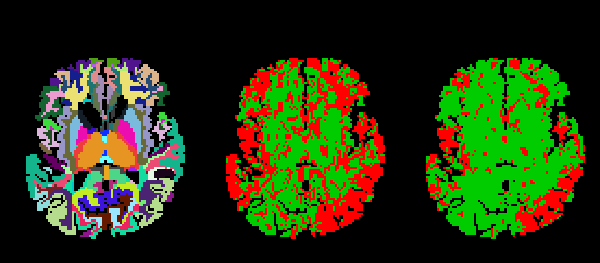

In [24]:
make_preview_thumbnail_a_d_e(
    ref_mode, pred_top1, mask_slice, red_mask,
    LABEL_COLORS_RGB, N_CLASSES,
    show=True, save=False, size_px=(600, 400)  # 或 (300, 200)
)


In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
from PIL import Image  # ★ 用于居中裁剪/缩放，确保严格3:2

def make_preview_thumbnail_a_d_e(
    ref_mode, pred_top1, mask_slice, red_mask,
    LABEL_COLORS_RGB, N_CLASSES,
    show=True, save=False, save_base="ismrm_preview",
    size_px=(600, 400),          # 目标像素（3:2）；可改(900, 600)等比例更清晰
    enforce_crop=True            # ★ 强制居中裁剪为3:2
):
    def idx_to_rgb(label_map, mask):
        H, W = label_map.shape
        rgb = np.zeros((H, W, 3), dtype=float)
        for c in range(N_CLASSES):
            m = (label_map == c) & (mask > 0)
            if np.any(m):
                rgb[m] = LABEL_COLORS_RGB.get(c, (0.0, 0.0, 0.0))
        rgb[~(mask > 0)] = 0.0
        return rgb

    a_rgb = idx_to_rgb(ref_mode, mask_slice)

    H, W = ref_mode.shape
    roi = mask_slice > 0

    d_rgb = np.zeros((H, W, 3), dtype=float)
    d_rgb[roi & (pred_top1 != ref_mode)] = (1.0, 0.0, 0.0)   # 红：错
    d_rgb[roi & (pred_top1 == ref_mode)] = (0.0, 0.8, 0.0)   # 绿：对

    e_rgb = np.zeros((H, W, 3), dtype=float)
    e_rgb[roi & red_mask]  = (1.0, 0.0, 0.0)                 # 红：Top-3 未覆盖
    e_rgb[roi & ~red_mask] = (0.0, 0.8, 0.0)                 # 绿：Top-3 覆盖

    # ---------- 固定画布像素 & 去掉一切留白 ----------
    w_px, h_px = size_px
    dpi = 100
    fig_w, fig_h = w_px / dpi, h_px / dpi

    plt.rcParams['figure.constrained_layout.use'] = False
    plt.rcParams['savefig.pad_inches'] = 0

    fig = plt.figure(figsize=(fig_w, fig_h), dpi=dpi, facecolor="white")
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, wspace=0, hspace=0)

    gs = gridspec.GridSpec(1, 3, figure=fig, left=0, right=1, bottom=0, top=1, wspace=0, hspace=0)
    axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
    for ax, img in zip(axes, [a_rgb, d_rgb, e_rgb]):
        ax.imshow(img, origin="lower", interpolation="nearest", aspect="equal")
        ax.axis("off")

    # ---------- 抓取画布像素 ----------
    fig.canvas.draw()
    cw, ch = fig.canvas.get_width_height()      # 当前画布像素（可能≠ size_px）
    buf = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
    img = buf.reshape((ch, cw, 3))
    plt.close(fig)  # 先关闭原图，避免重复显示

    # ---------- 居中裁剪为严格 3:2 ----------
    if enforce_crop:
        target_ratio = 3 / 2
        ratio = cw / ch
        if ratio > target_ratio:
            # 太宽：裁宽度
            new_w = int(ch * target_ratio)
            x0 = (cw - new_w) // 2
            x1 = x0 + new_w
            img = img[:, x0:x1, :]
        elif ratio < target_ratio:
            # 太高：裁高度
            new_h = int(cw / target_ratio)
            y0 = (ch - new_h) // 2
            y1 = y0 + new_h
            img = img[y0:y1, :, :]

    # ---------- 缩放到目标像素（600×400或你指定的） ----------
    pil_img = Image.fromarray(img)
    pil_img = pil_img.resize(size_px, resample=Image.LANCZOS)

    # ---------- 显示 & 保存 ----------
    if show:
        plt.figure(figsize=(size_px[0]/dpi, size_px[1]/dpi), dpi=dpi)
        plt.imshow(pil_img)
        plt.axis("off")
        plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
        plt.show()

    if save:
        out = f"{save_base}_{size_px[0]}x{size_px[1]}.png"
        pil_img.save(out, optimize=True)
        print(f"Saved: {out}")


In [11]:
make_preview_thumbnail_a_d_e(
    ref_mode, pred_top1, mask_slice, red_mask,
    LABEL_COLORS_RGB, N_CLASSES,
    show=True, save=False,
    size_px=(600, 400),
    enforce_crop=True
)


NameError: name 'ref_mode' is not defined